## Analyzing Evolution of alignn model
#### V2- Loss landscape generation setup:
    Step (resolution) = 40, Scale factor (perturbation magnitude) = 0.3


## Overview

This notebook provides a comprehensive analysis of the evolution of ALIGNN models throughout an active learning process. The analysis examines how model behavior changes as training data increases across three iterations of active learning.

### Research Questions
- How do model prediction errors evolve with increasing training data?
- How do the geometric properties of the loss landscape change during training?
- What can Hessian eigenvalue analysis tell us about model optimization characteristics?

### Experimental Setup
- **3 iterations** of active learning with progressively larger training datasets
- **3 models per iteration** (alignn_1, alignn_2, alignn_3) for statistical robustness
- Target property: Formation energy (dHf)

### Analysis Framework
1. **Quantitative Performance Analysis**: Model prediction error on different test sets
2. **Optimization Landscape Analysis**: Hessian eigenvalue computation and interpretation
3. **Loss Landscape Visualization**: Qualitative assessment of loss landscape flatness and geometry

### Key Datasets
- **Training sets**: Progressively expanded through active learning
- **Test sets**: Fixed test set, High Uncertainty (HU), Low Uncertainty (LU), and holdout sets


## 1. Environment Setup and Data Loading

### Import Required Libraries
Setting up the analysis environment with necessary libraries for data manipulation, visualization, and numerical computation.


In [1]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import warnings
warnings.filterwarnings("ignore", category=FutureWarning, message="'force_all_finite' was renamed to 'ensure_all_finite'")

### Load Pre-computed Loss Landscape Data

Loading loss landscape data that was previously computed for all 9 models (3 iterations × 3 models each). These loss landscapes were generated for all 9760 samples using Hessian eigenvector computed on the 250 samples with lowest prediction error for each model.

In [2]:
folders = [r'computed_loss_landscapes\fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter1_alignn1_lowest250_error', r'computed_loss_landscapes\fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter2_alignn1_lowest250_error', r'computed_loss_landscapes\fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter3_alignn1_lowest250_error',
            r'computed_loss_landscapes\fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter1_alignn2_lowest250_error', r'computed_loss_landscapes\fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter2_alignn2_lowest250_error', r'computed_loss_landscapes\fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter3_alignn2_lowest250_error',
            r'computed_loss_landscapes\fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter1_alignn3_lowest250_error', r'computed_loss_landscapes\fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter2_alignn3_lowest250_error', r'computed_loss_landscapes\fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter3_alignn3_lowest250_error']

In [3]:
loss_function_dicts = []
for folder in folders:
    with open(os.path.join(folder,'processed_loss_function_dict.pkl'), 'rb') as file:
        loss_function_dicts.append(pickle.load(file))


# Merge all dictionaries from loss_function_dicts into a single dictionary
merged_loss_function_dict = {}
for d in loss_function_dicts:
    for key, value in d.items():
        if key not in merged_loss_function_dict:
            merged_loss_function_dict[key] = value
        else:
            # If key exists, update/append values
            merged_loss_function_dict[key].update(value)

# Update the loss_function_dict to use merged version
loss_function_dict = merged_loss_function_dict

with open(os.path.join(folders[0],'feat_sample_df.pkl'), 'rb') as file:
    feat_sample_df = pickle.load(file)

with open(os.path.join(folders[0],'feat_sample_composition_df.pkl'), 'rb') as file:
    feat_sample_composition_df = pickle.load(file)

with open(os.path.join(folders[0],'feat_sample_structure_df.pkl'), 'rb') as file:
    feat_sample_structure_df = pickle.load(file)

sample_dict = {
    'feat_sample_df': feat_sample_df,
    'feat_sample_composition_df': feat_sample_composition_df,
    'feat_sample_structure_df': feat_sample_structure_df}

combined_dict = {**sample_dict, **loss_function_dict}

## 2. Training Data Analysis

### Extract Training Set Identifiers

Loading the training datasets from each iteration to analyze data distribution and identify samples used across different phases of active learning. 

In [4]:
# Load dataframes and extract jids
all_df = combined_dict['feat_sample_df']

all_data_jids = combined_dict['feat_sample_df']['jid'].values

iter1_train_jids = pd.read_pickle("data/subset/iter1_train/iter1_train.pkl")['jid'].values
iter2_train_jids = pd.read_pickle("data/subset/iter2_train/iter2_train.pkl")['jid'].values
iter3_train_jids = pd.read_pickle("data/subset/iter3_train/iter3_train.pkl")['jid'].values

# Find jids that are in all_data_jids but not in any of the iter train sets
all_iter_train_jids = set(iter1_train_jids) | set(iter2_train_jids) | set(iter3_train_jids)
holdout_jids = list(set(all_data_jids) - all_iter_train_jids)

print(f"Total jids in all_data_jids: {len(all_data_jids)}")
print(f"Total jids in iter1_train: {len(iter1_train_jids)}")
print(f"Total jids in iter2_train: {len(iter2_train_jids)}")
print(f"Total jids in iter3_train: {len(iter3_train_jids)}")
print(f"Total unique jids across all iter trains: {len(all_iter_train_jids)}")
print(f"Total jids not in any iter train: {len(holdout_jids)}")

Total jids in all_data_jids: 9760
Total jids in iter1_train: 630
Total jids in iter2_train: 1773
Total jids in iter3_train: 3233
Total unique jids across all iter trains: 3422
Total jids not in any iter train: 6338


### Training Data Distribution Analysis

Examining the distribution of formation energy (dHf) values across the three training iterations. This analysis reveals how active learning progressively samples from different regions of the target property space.

**Key Observation**: The first iteration training set shows limited coverage of the full formation energy range, indicating that active learning starts with a biased sample that gradually becomes more representative of the complete data distribution.

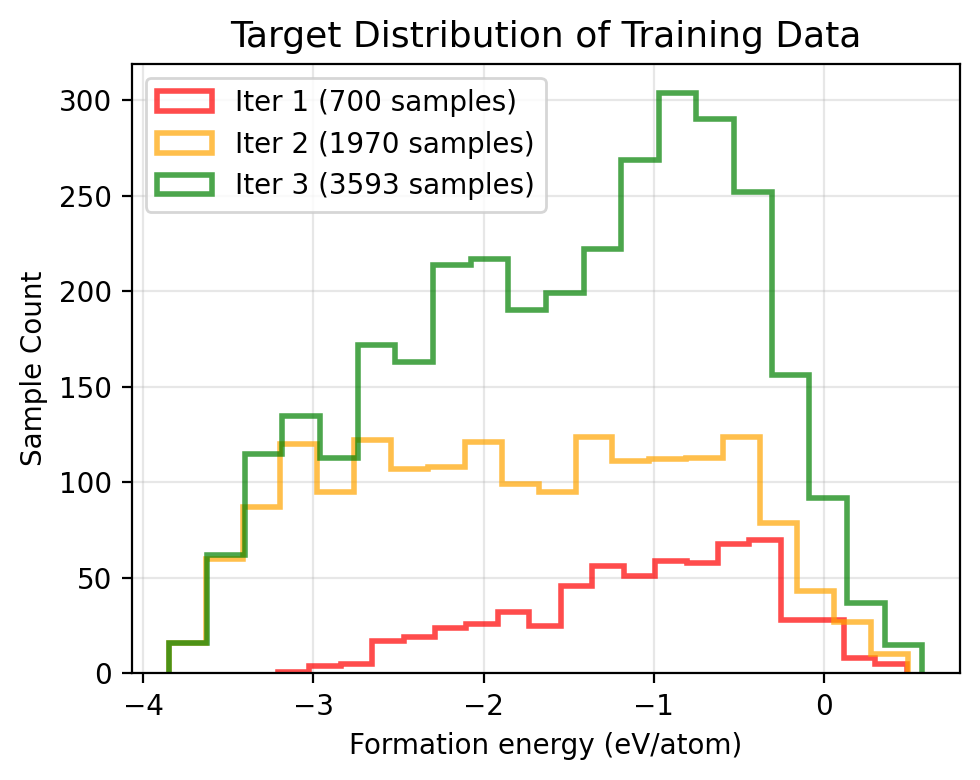

In [5]:
iter_1_train_df = pd.read_pickle("data/subset/iter1_train/iter1_train.pkl")
iter_2_train_df = pd.read_pickle("data/subset/iter2_train/iter2_train.pkl")
iter_3_train_df = pd.read_pickle("data/subset/iter3_train/iter3_train.pkl")

iter_1_train_dHf = iter_1_train_df['dHf'].values
iter_2_train_dHf = iter_2_train_df['dHf'].values
iter_3_train_dHf = iter_3_train_df['dHf'].values

# Plot density histograms for dHf values from three different training datasets
fig, ax = plt.subplots(figsize=(5, 4), dpi=200)
bins = 20
density = False
# Create histogram data for iter_1_train_dHf
ax.hist(iter_1_train_dHf, bins=bins, density=density, histtype='step', linewidth=2, label='Iter 1 (700 samples)', color='red', alpha=0.7)
ax.hist(iter_2_train_dHf, bins=bins, density=density, histtype='step', linewidth=2, label='Iter 2 (1970 samples)', color='orange', alpha=0.7)
ax.hist(iter_3_train_dHf, bins=bins, density=density, histtype='step', linewidth=2, label='Iter 3 (3593 samples)', color='green', alpha=0.7)
#ax.set_yscale('log')
ax.set_xlabel('Formation energy (eV/atom)', fontsize=10)
ax.set_ylabel('Sample Count', fontsize=10)
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3)
ax.tick_params(axis='y', labelsize=10)
ax.tick_params(axis='x', labelsize=10)
ax.set_title('Target Distribution of Training Data', fontsize=13)
plt.tight_layout()
plt.show()

### Test Set Definition and Sample Identification

Loading identifiers for different test subsets used in the evaluation:

- **ITS (Initially Chosen Test Set)**: Fixed test set
- **HU (High Uncertainty)**: Samples identified as having high prediction uncertainty
- **LU (Low Uncertainty)**: Samples identified as having low prediction uncertainty

These test sets are designed to evaluate model performance across different uncertainty regimes and provide insights into how models handle various types of materials data. The methodology is detailed in the paper "Leveraging Domain Adaptation for Accurate Machine Learning Predictions of New Halide Perovskites".

In [6]:
its_iter_1_csv = pd.read_csv(r'data\raw\its_iteration_1.csv')
its_iter_1_jids = its_iter_1_csv['file_name'].tolist()
its_iter_1_jids = [jid.replace('.cif', '') for jid in its_iter_1_jids]
its_iter_2_csv = pd.read_csv(r'data\raw\its_iteration_2.csv')
its_iter_2_jids = its_iter_2_csv['file_name'].tolist()
its_iter_2_jids = [jid.replace('.cif', '') for jid in its_iter_2_jids]
its_iter_3_csv = pd.read_csv(r'data\raw\its_iteration_3.csv')
its_iter_3_jids = its_iter_3_csv['file_name'].tolist()
its_iter_3_jids = [jid.replace('.cif', '') for jid in its_iter_3_jids]

HU_iter_1_csv = pd.read_csv(r'data\raw\ef_hu_iteration_1.csv')
HU_iter_1_jids = HU_iter_1_csv['file_name'].tolist()
HU_iter_1_jids = [jid.replace('.cif', '') for jid in HU_iter_1_jids]
HU_iter_2_csv = pd.read_csv(r'data\raw\ef_hu_iteration_2.csv')
HU_iter_2_jids = HU_iter_2_csv['file_name'].tolist()
HU_iter_2_jids = [jid.replace('.cif', '') for jid in HU_iter_2_jids]
HU_iter_3_csv = pd.read_csv(r'data\raw\ef_hu_iteration_3.csv')
HU_iter_3_jids = HU_iter_3_csv['file_name'].tolist()
HU_iter_3_jids = [jid.replace('.cif', '') for jid in HU_iter_3_jids]

LU_iter_1_csv = pd.read_csv(r'data\raw\ef_lu_iteration_1.csv')
LU_iter_1_jids = LU_iter_1_csv['file_name'].tolist()
LU_iter_1_jids = [jid.replace('.cif', '') for jid in LU_iter_1_jids]
LU_iter_2_csv = pd.read_csv(r'data\raw\ef_lu_iteration_2.csv')
LU_iter_2_jids = LU_iter_2_csv['file_name'].tolist()
LU_iter_2_jids = [jid.replace('.cif', '') for jid in LU_iter_2_jids]
LU_iter_3_csv = pd.read_csv(r'data\raw\ef_lu_iteration_3.csv')
LU_iter_3_jids = LU_iter_3_csv['file_name'].tolist()
LU_iter_3_jids = [jid.replace('.cif', '') for jid in LU_iter_3_jids]

print(f"its_iter_1_jids: {len(its_iter_1_jids)}")
print(f"its_iter_2_jids: {len(its_iter_2_jids)}")
print(f"its_iter_3_jids: {len(its_iter_3_jids)}")
print(f"HU_iter_1_jids: {len(HU_iter_1_jids)}")
print(f"HU_iter_2_jids: {len(HU_iter_2_jids)}")
print(f"HU_iter_3_jids: {len(HU_iter_3_jids)}")
print(f"LU_iter_1_jids: {len(LU_iter_1_jids)}")
print(f"LU_iter_2_jids: {len(LU_iter_2_jids)}")
print(f"LU_iter_3_jids: {len(LU_iter_3_jids)}")

paper_test_jids = set(its_iter_1_jids + its_iter_2_jids + its_iter_3_jids + HU_iter_1_jids + HU_iter_2_jids + HU_iter_3_jids + LU_iter_1_jids + LU_iter_2_jids + LU_iter_3_jids)

its_iter_1_jids: 270
its_iter_2_jids: 1873
its_iter_3_jids: 1877
HU_iter_1_jids: 1679
HU_iter_2_jids: 1623
HU_iter_3_jids: 790
LU_iter_1_jids: 1873
LU_iter_2_jids: 1877
LU_iter_3_jids: 948


## 3. Model Performance Evolution Analysis

### Prediction Error Trends Across Training Iterations

Analyzing how model prediction accuracy evolves as training data increases. This section examines Mean Absolute Error (MAE) trends across different test sets to understand the relationship between training data size and model performance.

**Key Finding**: A performance plateau is observed from iteration 2 to iteration 3 across all test sets, suggesting diminishing returns from additional training data beyond a certain threshold.

In [7]:

from util.landscape_processing import loss_at_origin

def get_mse_loss_at_origin(jids, iter_num, alignn_version=1):
    if iter_num == 1:
        if alignn_version == 2:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter1_alignn2_lowest250_error_mse'
        elif alignn_version == 3:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter1_alignn3_lowest250_error_mse'
        else:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter1_alignn1_lowest250_error_mse'
    elif iter_num == 2:
        if alignn_version == 2:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter2_alignn2_lowest250_error_mse'
        elif alignn_version == 3:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter2_alignn3_lowest250_error_mse'
        else:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter_2_alignn1_lowest250_error_mse'
    elif iter_num == 3:
        if alignn_version == 2:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter3_alignn2_lowest250_error_mse'
        elif alignn_version == 3:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter3_alignn3_lowest250_error_mse'
        else:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter_3_alignn1_lowest250_error_mse'
    else:
        raise ValueError("iter_num must be 1, 2, or 3")
    df = loss_function_dict[key].copy()
    all_jids = df['jid']
    idx = np.where(np.isin(all_jids, jids))[0]

    avg_landscape = (np.mean(df[key+'_loss_landscape_array'][idx], axis=0))
    loss = loss_at_origin(avg_landscape)
    return loss



In [8]:
# Helper function to calculate MAE statistics
def calculate_mae_stats(df, jids, model_prefix):
    mae_values = []
    for i in range(1, 4):  # 1, 2, 3
        mae = df[df['jid'].isin(jids)][f'abs_err_{model_prefix}_{i}'].mean()
        mae_values.append(mae) 
    return np.mean(mae_values), np.std(mae_values)

def calculate_mse_stats(df, jids, model_prefix):
    mse_values = []
    for i in range(1, 4):  # 1, 2, 3
        mse = df[df['jid'].isin(jids)][f'abs_err_{model_prefix}_{i}'].apply(lambda x: x**2).mean()
        mse_values.append(mse) 
    return np.mean(mse_values), np.std(mse_values)


In [9]:

# Calculate MSE statistics for each test set and model
# Fixed ITS (using iter_1_jids for all models)
mean_mse_fixed_its_1, std_mse_fixed_its_1 = calculate_mse_stats(all_df, its_iter_1_jids, 'alignn_1')
mean_mse_fixed_its_2, std_mse_fixed_its_2 = calculate_mse_stats(all_df, its_iter_1_jids, 'alignn_2')
mean_mse_fixed_its_3, std_mse_fixed_its_3 = calculate_mse_stats(all_df, its_iter_1_jids, 'alignn_3')

# Changing ITS
mean_mse_changing_its_1, std_mse_changing_its_1 = calculate_mse_stats(all_df, its_iter_1_jids, 'alignn_1')
mean_mse_changing_its_2, std_mse_changing_its_2 = calculate_mse_stats(all_df, its_iter_2_jids, 'alignn_2')
mean_mse_changing_its_3, std_mse_changing_its_3 = calculate_mse_stats(all_df, its_iter_3_jids, 'alignn_3')

# Changing HU
mean_mse_changing_hu_1, std_mse_changing_hu_1 = calculate_mse_stats(all_df, HU_iter_1_jids, 'alignn_1')
mean_mse_changing_hu_2, std_mse_changing_hu_2 = calculate_mse_stats(all_df, HU_iter_2_jids, 'alignn_2')
mean_mse_changing_hu_3, std_mse_changing_hu_3 = calculate_mse_stats(all_df, HU_iter_3_jids, 'alignn_3')

# Changing LU
mean_mse_lu_iter_1, std_mse_lu_iter_1 = calculate_mse_stats(all_df, LU_iter_1_jids, 'alignn_1')
mean_mse_lu_iter_2, std_mse_lu_iter_2 = calculate_mse_stats(all_df, LU_iter_2_jids, 'alignn_2')
mean_mse_lu_iter_3, std_mse_lu_iter_3 = calculate_mse_stats(all_df, LU_iter_3_jids, 'alignn_3')

sample_counts = [700, 1970, 3593]

# Prepare data for plotting
mse_fixed_test = [mean_mse_fixed_its_1, mean_mse_fixed_its_2, mean_mse_fixed_its_3]
mse_its_test = [mean_mse_changing_its_1, mean_mse_changing_its_2, mean_mse_changing_its_3]
mse_HU_test = [mean_mse_changing_hu_1, mean_mse_changing_hu_2, mean_mse_changing_hu_3]
mse_LU_test = [mean_mse_lu_iter_1, mean_mse_lu_iter_2, mean_mse_lu_iter_3]

# Prepare error bars (standard deviations)
mse_fixed_test_std = [std_mse_fixed_its_1, std_mse_fixed_its_2, std_mse_fixed_its_3]
mse_its_test_std = [std_mse_changing_its_1, std_mse_changing_its_2, std_mse_changing_its_3]
mse_LU_test_std = [std_mse_lu_iter_1, std_mse_lu_iter_2, std_mse_lu_iter_3]
mse_HU_test_std = [std_mse_changing_hu_1, std_mse_changing_hu_2, std_mse_changing_hu_3]


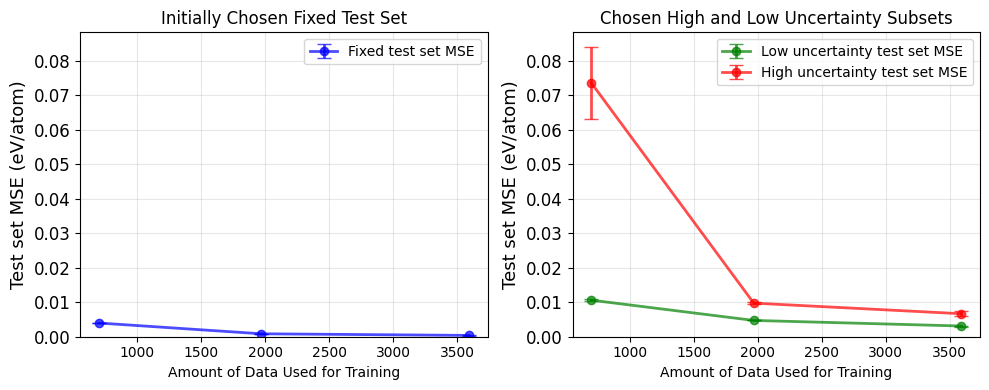

In [10]:

# Create figure and subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=None)

# Calculate y-axis limits to keep them consistent
all_values = mse_fixed_test + mse_LU_test + mse_HU_test + mse_its_test
all_errors = mse_fixed_test_std + mse_LU_test_std + mse_HU_test_std + mse_its_test_std
y_min = min([v - e for v, e in zip(all_values, all_errors)]) * 0.95
y_max = max([v + e for v, e in zip(all_values, all_errors)]) * 1.05

# Left subplot: Fixed ITS
ax1.errorbar(sample_counts, mse_fixed_test, yerr=mse_fixed_test_std, label='Fixed test set MSE', marker='o', linewidth=2, color='blue', alpha=0.7, capsize=5)
ax1.set_xlabel('Amount of Data Used for Training')
ax1.set_ylabel('Test set MSE (eV/atom)', fontsize=13)
ax1.set_title('Initially Chosen Fixed Test Set')
ax1.legend()
ax1.grid(True, alpha=0.3)
ax1.tick_params(axis='y', labelsize=12)
ax1.set_ylim(0, y_max)

# Right subplot: Changing test sets
ax2.errorbar(sample_counts, mse_LU_test, yerr=mse_LU_test_std, label='Low uncertainty test set MSE', marker='o', linewidth=2, color='green', alpha=0.7, capsize=5)
ax2.errorbar(sample_counts, mse_HU_test, yerr=mse_HU_test_std, label='High uncertainty test set MSE', marker='o', linewidth=2, color='red', alpha=0.7, capsize=5)
# ax2.errorbar(sample_counts, mse_its_test, yerr=mse_its_test_std, label='Changing ITS test set MSE', marker='o', linewidth=2, color='purple', alpha=0.7, capsize=5)
ax2.set_xlabel('Amount of Data Used for Training')
ax2.set_ylabel('Test set MSE (eV/atom)', fontsize=13)
ax2.set_title('Chosen High and Low Uncertainty Subsets')
ax2.legend()
ax2.grid(True, alpha=0.3)
ax2.tick_params(axis='y', labelsize=12)
ax2.set_ylim(0, y_max)

plt.tight_layout()
plt.show()


In [11]:

eigenvalue_files_2 = [r'eigenvectors\fixed_Aug5_iter_1_alignn_1_lowest_250_error\eigenvalues.txt',
                      r'eigenvectors\fixed_Aug5_iter_1_alignn_2_lowest_250_error\eigenvalues.txt',
                      r'eigenvectors\fixed_Aug5_iter_1_alignn_3_lowest_250_error\eigenvalues.txt',
                      r'eigenvectors\fixed_Aug5_iter_2_alignn_1_lowest_250_error\eigenvalues.txt',
                      r'eigenvectors\fixed_Aug5_iter_2_alignn_2_lowest_250_error\eigenvalues.txt',
                      r'eigenvectors\fixed_Aug5_iter_2_alignn_3_lowest_250_error\eigenvalues.txt',
                      r'eigenvectors\fixed_Aug5_iter_3_alignn_1_lowest_250_error\eigenvalues.txt',
                      r'eigenvectors\fixed_Aug5_iter_3_alignn_2_lowest_250_error\eigenvalues.txt',
                      r'eigenvectors\fixed_Aug5_iter_3_alignn_3_lowest_250_error\eigenvalues.txt']
                      
max_eigenvals_2 = {}
min_eigenvals_2 = {}

pruning_levels_2 = {
    'iter_1': 700,
    'iter_2': 1970,
    'iter_3': 3593
}

for file_path in eigenvalue_files_2:
    try:
        with open(file_path, 'r') as f:
            lines = f.readlines()
            
        # Extract model name from file path
        model_name = file_path.split('\\')[-2].replace('fixed_Aug5_', '')
        model_name = model_name.replace('_lowest_250_error', '')

    
        # Parse the eigenvalue information
        for line in lines:
            if line.startswith('Maximum eigenvalue:'):
                max_eigenval = float(line.split(':')[1].strip())
                max_eigenvals_2[model_name] = max_eigenval
            elif line.startswith('Minimum eigenvalue:'):
                min_eigenval = float(line.split(':')[1].strip())
                min_eigenvals_2[model_name] = min_eigenval
                
    except FileNotFoundError:
        print(f"File not found: {file_path}")
    except Exception as e:
        print(f"Error processing {file_path}: {e}")


model_variations = ['_alignn_1', '_alignn_2', '_alignn_3']

# Organize eigenvalue data by pruning strategy and sample count
alignn_eigenvals = {}

# Collect eigenvalue data for LL pruned models
for i in range(1, 4):  # 
    base_name = f'iter_{i}'
    sample_count = pruning_levels_2[base_name]
    
    max_eigenvals_list = []
    min_eigenvals_list = []
    
    for variation in model_variations:
        model_name = base_name + variation
        if model_name in max_eigenvals_2:
            max_eigenvals_list.append(max_eigenvals_2[model_name])
            min_eigenvals_list.append(min_eigenvals_2[model_name])
    
    if max_eigenvals_list:  # If we have data for this pruning level
        alignn_eigenvals[sample_count] = {
            'max_eigenval_mean': np.mean(max_eigenvals_list),
            'max_eigenval_std': np.std(max_eigenvals_list),
            'min_eigenval_mean': np.mean(min_eigenvals_list),
            'min_eigenval_std': np.std(min_eigenvals_list)
        }

# Prepare eigenvalue data for plotting
alignn_samples = sorted(alignn_eigenvals.keys())
alignn_max_eigenval_means = [alignn_eigenvals[s]['max_eigenval_mean'] for s in alignn_samples]
alignn_max_eigenval_stds = [alignn_eigenvals[s]['max_eigenval_std'] for s in alignn_samples]
alignn_min_eigenval_means = [alignn_eigenvals[s]['min_eigenval_mean'] for s in alignn_samples]
alignn_min_eigenval_stds = [alignn_eigenvals[s]['min_eigenval_std'] for s in alignn_samples]


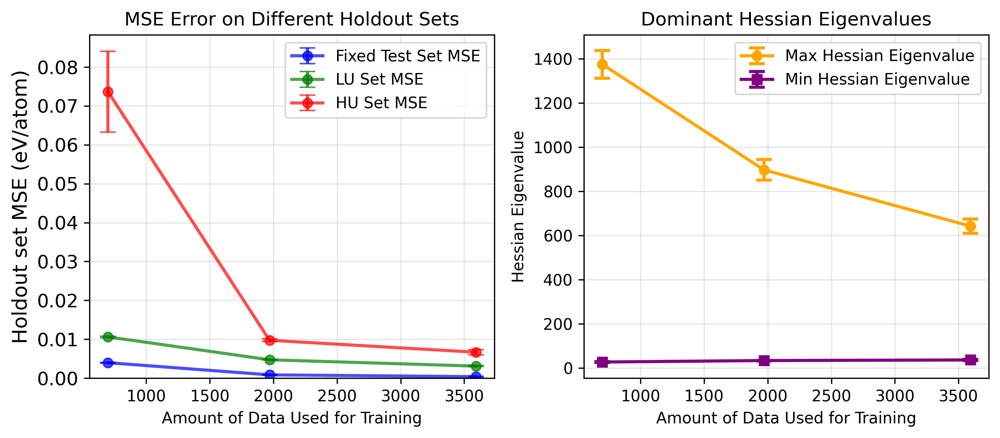

In [12]:
# Create figure with 2 subplots in one row
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4), dpi=300)

# Calculate y-axis limits for MSE plots to keep them consistent
all_values = mse_fixed_test + mse_LU_test + mse_HU_test + mse_its_test
all_errors = mse_fixed_test_std + mse_LU_test_std + mse_HU_test_std + mse_its_test_std
y_min = min([v - e for v, e in zip(all_values, all_errors)]) * 0.95
y_max = max([v + e for v, e in zip(all_values, all_errors)]) * 1.05

# First subplot: All MSE data combined
ax1.errorbar(sample_counts, mse_fixed_test, yerr=mse_fixed_test_std, label='Fixed Test Set MSE', marker='o', linewidth=2, color='blue', alpha=0.7, capsize=5)
ax1.errorbar(sample_counts, mse_LU_test, yerr=mse_LU_test_std, label='LU Set MSE', marker='o', linewidth=2, color='green', alpha=0.7, capsize=5)
ax1.errorbar(sample_counts, mse_HU_test, yerr=mse_HU_test_std, label='HU Set MSE', marker='o', linewidth=2, color='red', alpha=0.7, capsize=5)
ax1.set_xlabel('Amount of Data Used for Training')
ax1.set_ylabel('Holdout set MSE (eV/atom)', fontsize=13)
ax1.set_title('MSE Error on Different Holdout Sets')
ax1.legend()
ax1.grid(True, alpha=0.3)
ax1.tick_params(axis='y', labelsize=12)
ax1.set_ylim(0, y_max)

# Second subplot: Eigenvalues
ax2.errorbar(alignn_samples, alignn_min_eigenval_means, yerr=alignn_min_eigenval_stds, 
             label='Max Hessian Eigenvalue', marker='o', capsize=5, capthick=2, linewidth=2, color='orange')
ax2.errorbar(alignn_samples, alignn_max_eigenval_means, yerr=alignn_max_eigenval_stds, 
             label='Min Hessian Eigenvalue', marker='s', capsize=5, capthick=2, linewidth=2, color='purple')

ax2.set_xlabel('Amount of Data Used for Training')
ax2.set_ylabel('Hessian Eigenvalue')
ax2.set_title('Dominant Hessian Eigenvalues')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


Log scaled plots

C:\Users\EthanH24\AppData\Local\Temp\ipykernel_21784\264933319.py:22: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax1.set_ylim(0, y_max)


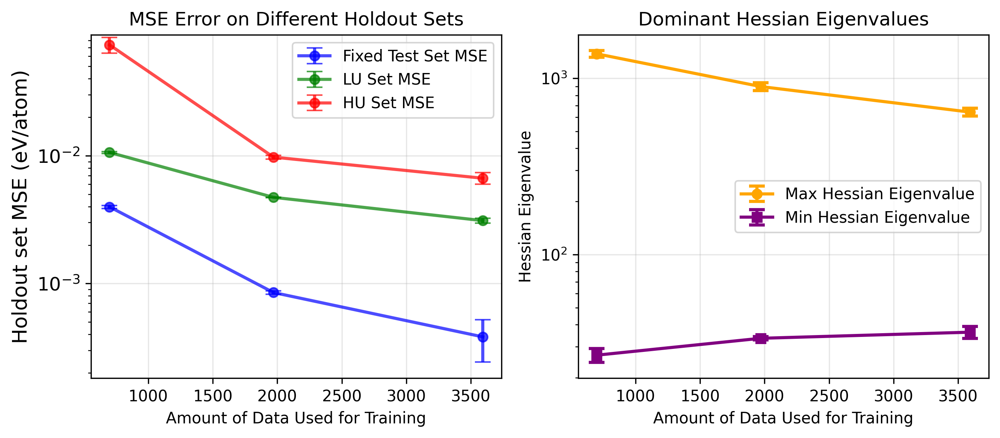

In [13]:
# Create figure with 2 subplots in one row
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4), dpi=300)

# Calculate y-axis limits for MSE plots to keep them consistent
all_values = mse_fixed_test + mse_LU_test + mse_HU_test + mse_its_test
all_errors = mse_fixed_test_std + mse_LU_test_std + mse_HU_test_std + mse_its_test_std
y_min = min([v - e for v, e in zip(all_values, all_errors)]) * 0.95
y_max = max([v + e for v, e in zip(all_values, all_errors)]) * 1.05

# First subplot: All MSE data combined
ax1.errorbar(sample_counts, mse_fixed_test, yerr=mse_fixed_test_std, label='Fixed Test Set MSE', marker='o', linewidth=2, color='blue', alpha=0.7, capsize=5)
ax1.errorbar(sample_counts, mse_LU_test, yerr=mse_LU_test_std, label='LU Set MSE', marker='o', linewidth=2, color='green', alpha=0.7, capsize=5)
ax1.errorbar(sample_counts, mse_HU_test, yerr=mse_HU_test_std, label='HU Set MSE', marker='o', linewidth=2, color='red', alpha=0.7, capsize=5)
ax1.set_xlabel('Amount of Data Used for Training')
ax1.set_ylabel('Holdout set MSE (eV/atom)', fontsize=13)
ax1.set_title('MSE Error on Different Holdout Sets')
ax1.legend()
ax1.set_yscale('log')

ax1.grid(True, alpha=0.3)
ax1.tick_params(axis='y', labelsize=12)
ax1.set_ylim(0, y_max)

# Second subplot: Eigenvalues in log10 scale
ax2.errorbar(alignn_samples, alignn_min_eigenval_means, yerr=alignn_min_eigenval_stds, 
             label='Max Hessian Eigenvalue', marker='o', capsize=5, capthick=2, linewidth=2, color='orange')
ax2.errorbar(alignn_samples, alignn_max_eigenval_means, yerr=alignn_max_eigenval_stds, 
             label='Min Hessian Eigenvalue', marker='s', capsize=5, capthick=2, linewidth=2, color='purple')

ax2.set_xlabel('Amount of Data Used for Training')
ax2.set_ylabel('Hessian Eigenvalue')
ax2.set_title('Dominant Hessian Eigenvalues')
ax2.set_yscale('log')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


Calculated prediction uncertainties for:
- Fixed test set: 3 iterations
- High uncertainty sets: 3 iterations
- Low uncertainty sets: 3 iterations


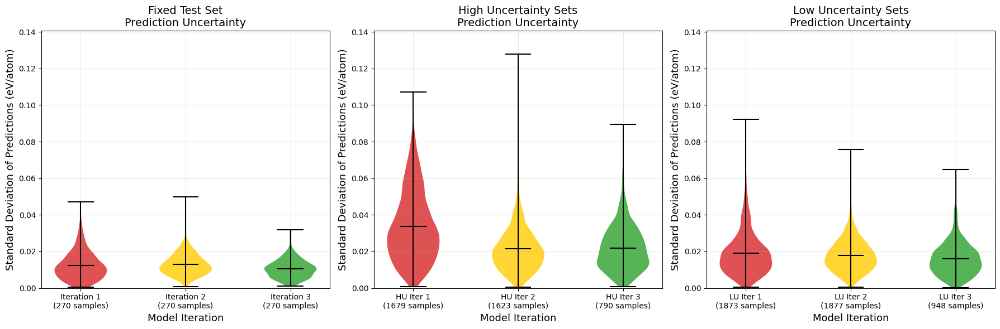

In [14]:
all_df.head()

def calculate_stds(df, jids, model_prefix):
    """
    Calculate standard deviation of predictions across three model runs for given JIDs.
    
    Args:
        df: DataFrame containing prediction data
        jids: List of JIDs to filter on
        model_prefix: Prefix for the model columns (e.g., 'alignn_3')
    
    Returns:
        Standard deviation of predictions across the three model runs
    """
    filtered_df = df[df['jid'].isin(jids)]
    pred_1 = filtered_df[f'pred_val_{model_prefix}_1']
    pred_2 = filtered_df[f'pred_val_{model_prefix}_2'] 
    pred_3 = filtered_df[f'pred_val_{model_prefix}_3']
    
    # Calculate standard deviation across the three predictions for each sample
    stds = np.std([pred_1, pred_2, pred_3], axis=0)
    
    return stds

# Calculate standard deviations for each iteration and model
fixed_test_set_std_data = []
fixed_test_set_labels = []
HU_set_std_data = []
HU_set_labels = []
LU_set_std_data = []
LU_set_labels = []

# For each iteration
for i in range(1, 4):
    # Get the appropriate test set JIDs for this iteration
    if i == 1:
        fixed_test_set_test_jids = its_iter_1_jids
        HU_set_test_jids = HU_iter_1_jids
        LU_set_test_jids = LU_iter_1_jids
    elif i == 2:
        fixed_test_set_test_jids = its_iter_1_jids
        HU_set_test_jids = HU_iter_2_jids
        LU_set_test_jids = LU_iter_2_jids
    else:
        fixed_test_set_test_jids = its_iter_1_jids
        HU_set_test_jids = HU_iter_3_jids
        LU_set_test_jids = LU_iter_3_jids

    # Calculate standard deviations for fixed test set (always using ITS iteration 1)
    fixed_test_set_stds = calculate_stds(all_df, fixed_test_set_test_jids, f'alignn_{i}')
    fixed_test_set_std_data.append(fixed_test_set_stds)
    fixed_test_set_labels.append(f'Iteration {i}\n({len(fixed_test_set_test_jids)} samples)')
    
    # Calculate standard deviations for high uncertainty test sets (changing each iteration)
    HU_set_stds = calculate_stds(all_df, HU_set_test_jids, f'alignn_{i}')
    HU_set_std_data.append(HU_set_stds)
    HU_set_labels.append(f'HU Iter {i}\n({len(HU_set_test_jids)} samples)')
    
    # Calculate standard deviations for low uncertainty test sets (changing each iteration)
    LU_set_stds = calculate_stds(all_df, LU_set_test_jids, f'alignn_{i}')
    LU_set_std_data.append(LU_set_stds)
    LU_set_labels.append(f'LU Iter {i}\n({len(LU_set_test_jids)} samples)')

print(f"Calculated prediction uncertainties for:")
print(f"- Fixed test set: {len(fixed_test_set_std_data)} iterations")
print(f"- High uncertainty sets: {len(HU_set_std_data)} iterations")
print(f"- Low uncertainty sets: {len(LU_set_std_data)} iterations")

# Calculate global y-axis limits
all_std_data = fixed_test_set_std_data + HU_set_std_data + LU_set_std_data
y_min = 0
y_max = max([max(stds) for stds in all_std_data]) * 1.1

# Create three violin plots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Define consistent colors for iterations: red for iter 1, yellow for iter 2, green for iter 3
colors = ['#d62728', '#ffcc00', '#2ca02c']  # red, yellow, green

# Plot 1: Fixed test set
violin_parts_1 = axes[0].violinplot(fixed_test_set_std_data, positions=range(1, 4), showmeans=True, showmedians=False)

# Customize violin plot colors for fixed test set
for i, pc in enumerate(violin_parts_1['bodies']):
    pc.set_facecolor(colors[i])
    pc.set_alpha(0.8)

# Customize other elements for fixed test set
violin_parts_1['cmeans'].set_color('black')
violin_parts_1['cbars'].set_color('black')
violin_parts_1['cmins'].set_color('black')
violin_parts_1['cmaxes'].set_color('black')

# Set labels and title for fixed test set
axes[0].set_xlabel('Model Iteration', fontsize=13)
axes[0].set_ylabel('Standard Deviation of Predictions (eV/atom)', fontsize=13)
axes[0].set_title('Fixed Test Set\nPrediction Uncertainty', fontsize=14)
axes[0].set_xticks(range(1, 4))
axes[0].set_xticklabels(fixed_test_set_labels)
axes[0].grid(True, alpha=0.3)
axes[0].set_ylim(y_min, y_max)

# Plot 2: High uncertainty sets
violin_parts_2 = axes[1].violinplot(HU_set_std_data, positions=range(1, 4), showmeans=True, showmedians=False)

# Customize violin plot colors for HU sets
for i, pc in enumerate(violin_parts_2['bodies']):
    pc.set_facecolor(colors[i])
    pc.set_alpha(0.8)

# Customize other elements for HU sets
violin_parts_2['cmeans'].set_color('black')
violin_parts_2['cbars'].set_color('black')
violin_parts_2['cmins'].set_color('black')
violin_parts_2['cmaxes'].set_color('black')

# Set labels and title for HU sets
axes[1].set_xlabel('Model Iteration', fontsize=13)
axes[1].set_ylabel('Standard Deviation of Predictions (eV/atom)', fontsize=13)
axes[1].set_title('High Uncertainty Sets\nPrediction Uncertainty', fontsize=14)
axes[1].set_xticks(range(1, 4))
axes[1].set_xticklabels(HU_set_labels)
axes[1].grid(True, alpha=0.3)
axes[1].set_ylim(y_min, y_max)

# Plot 3: Low uncertainty sets
violin_parts_3 = axes[2].violinplot(LU_set_std_data, positions=range(1, 4), showmeans=True, showmedians=False)

# Customize violin plot colors for LU sets
for i, pc in enumerate(violin_parts_3['bodies']):
    pc.set_facecolor(colors[i])
    pc.set_alpha(0.8)

# Customize other elements for LU sets
violin_parts_3['cmeans'].set_color('black')
violin_parts_3['cbars'].set_color('black')
violin_parts_3['cmins'].set_color('black')
violin_parts_3['cmaxes'].set_color('black')

# Set labels and title for LU sets
axes[2].set_xlabel('Model Iteration', fontsize=13)
axes[2].set_ylabel('Standard Deviation of Predictions (eV/atom)', fontsize=13)
axes[2].set_title('Low Uncertainty Sets\nPrediction Uncertainty', fontsize=14)
axes[2].set_xticks(range(1, 4))
axes[2].set_xticklabels(LU_set_labels)
axes[2].grid(True, alpha=0.3)
axes[2].set_ylim(y_min, y_max)

plt.tight_layout()
plt.show()


## 4. Hessian Eigenvalue Analysis

### Loss Landscape Curvature Characterization

Analyzing the geometric properties of the loss landscape through Hessian eigenvalue computation. For each model, eigenvalues are computed using the 250 samples with the lowest prediction error to characterize the local curvature properties around the optimal solution.

**Methodology**: Hessian eigenvalues provide insight into the optimization landscape:
- **Maximum eigenvalues**: Indicate the steepest curvature direction
- **Minimum eigenvalues**: Indicate the flattest curvature direction
- **Eigenvalue trends**: Reveal how loss landscape geometry changes with training data

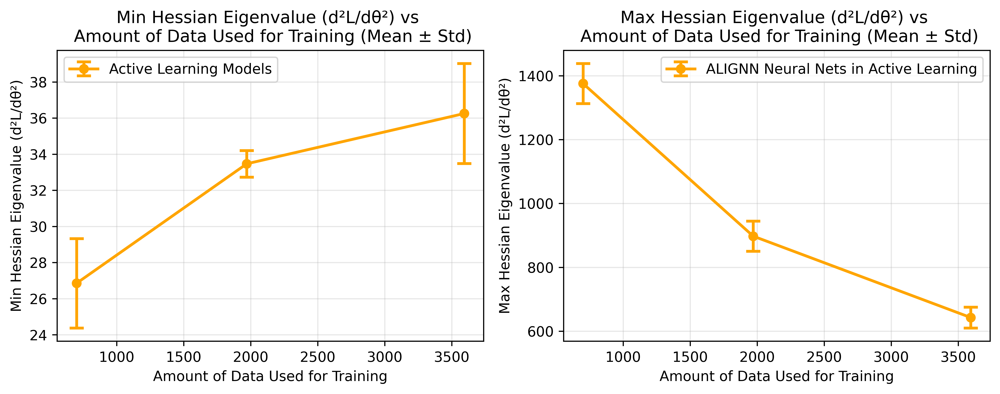

Eigenvalue Summary by Sample Count:

Sample Count: 700
------------------------------
Alignn Pruned - Max Eigenval: 26.8514 ± 2.4744, Min Eigenval: 1375.9220 ± 62.6646

Sample Count: 1970
------------------------------
Alignn Pruned - Max Eigenval: 33.4679 ± 0.7369, Min Eigenval: 897.6011 ± 47.1884

Sample Count: 3593
------------------------------
Alignn Pruned - Max Eigenval: 36.2519 ± 2.7696, Min Eigenval: 642.6545 ± 32.7435


In [15]:

# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=600)

# Plot Maximum Eigenvalues with error bars
ax1.errorbar(alignn_samples, alignn_max_eigenval_means, yerr=alignn_max_eigenval_stds, 
             label='Active Learning Models', marker='o', capsize=5, capthick=2, linewidth=2, color='orange')

ax1.set_xlabel('Amount of Data Used for Training')
ax1.set_ylabel('Min Hessian Eigenvalue (d²L/dθ²)')
ax1.set_title('Min Hessian Eigenvalue (d²L/dθ²) vs \n Amount of Data Used for Training (Mean ± Std)')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot Minimum Eigenvalues with error bars
ax2.errorbar(alignn_samples, alignn_min_eigenval_means, yerr=alignn_min_eigenval_stds, 
             label='ALIGNN Neural Nets in Active Learning', marker='o', capsize=5, capthick=2, linewidth=2, color='orange')

ax2.set_xlabel('Amount of Data Used for Training')
ax2.set_ylabel('Max Hessian Eigenvalue (d²L/dθ²)')
ax2.set_title('Max Hessian Eigenvalue (d²L/dθ²) vs \n Amount of Data Used for Training (Mean ± Std)')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print summary statistics grouped by sample count
print("Eigenvalue Summary by Sample Count:")
print("=" * 60)

for sample_count in alignn_samples:
    print(f"\nSample Count: {sample_count}")
    print("-" * 30)
    
    # Alignn Pruned results for this sample count
    if sample_count in alignn_eigenvals:
        alignn_data = alignn_eigenvals[sample_count]
        print(f"Alignn Pruned - Max Eigenval: {alignn_data['max_eigenval_mean']:.4f} ± {alignn_data['max_eigenval_std']:.4f}, Min Eigenval: {alignn_data['min_eigenval_mean']:.4f} ± {alignn_data['min_eigenval_std']:.4f}")


## 5. Loss Landscape Visualization

### Qualitative Assessment of Loss Surface Geometry

Visualizing loss landscapes across different test subsets to understand how the optimization surface changes throughout training iterations. The loss landscapes are computed along the dominant Hessian eigenvector directions to reveal the most significant variations in the loss function.

**The visualization now comes with quantification of loss landscape width and the distance between original model and lowest loss model.**

**Key Observation**: Across all test subsets, the loss landscapes show a consistent flattening trend as training iterations progress, indicating that models converge to broader, more stable minima with increased training data.

In [16]:
# Helper for average log-loss landscape plotting
from util.general import flatten_and_vstack


def get_avg_landscape(jids, iter_num, alignn_version=1):
    if iter_num == 1:
        if alignn_version == 2:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter1_alignn2_lowest250_error_mse'
        elif alignn_version == 3:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter1_alignn3_lowest250_error_mse'
        else:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter1_alignn1_lowest250_error_mse'
    elif iter_num == 2:
        if alignn_version == 2:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter2_alignn2_lowest250_error_mse'
        elif alignn_version == 3:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter2_alignn3_lowest250_error_mse'
        else:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter_2_alignn1_lowest250_error_mse'
    elif iter_num == 3:
        if alignn_version == 2:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter3_alignn2_lowest250_error_mse'
        elif alignn_version == 3:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter3_alignn3_lowest250_error_mse'
        else:
            key = 'fixed_nov21_all_labeled_ON_EIGVEC_fixed_Aug5_iter_3_alignn1_lowest250_error_mse'
    else:
        raise ValueError("iter_num must be 1, 2, or 3")
    df = loss_function_dict[key].copy()
    all_jids = df['jid']
    idx = np.where(np.isin(all_jids, jids))[0]

    avg_landscape = np.log10(np.mean(df[key+'_loss_landscape_array'][idx], axis=0))
    return avg_landscape


Measuring the width of an iso-loss contour with the assumption that the contour is oval shaped with the center at local min.

In [17]:
import numpy as np
import matplotlib.pyplot as plt

def get_min_width_via_sweep_all_segments(ax, X, Y, Z, level=0.0):
    """
    Calculates the shortest width passing through the Global Minimum.
    CORRECTED: Checks ALL disjoint segments of the contour level (e.g., left and right walls).
    """
    # 1. Find Global Minimum
    min_idx = np.unravel_index(np.argmin(Z), Z.shape)
    min_y, min_x = Y[min_idx], X[min_idx]
    min_pt = np.array([min_x, min_y])
    center_point = np.array([X[X.shape[0]//2, X.shape[1]//2], Y[Y.shape[0]//2, Y.shape[1]//2]])

    dist_min_center = np.linalg.norm(min_pt - center_point)
    
    # 2. Extract ALL contour segments at this level
    cs = ax.contour(X, Y, Z, levels=[level], alpha=0) 
    segs = cs.allsegs[0] if cs.allsegs else []
    
    if not segs: return None
    
    # Pre-calculate relative vertices for ALL segments
    # This creates a list of arrays: [ (N,2), (M,2), ... ]
    all_verts_rel = [s - min_pt for s in segs]
    
    # 3. Sweep Angles (0 to 180 degrees)
    thetas = np.linspace(0, np.pi, 180)
    
    min_width = np.inf
    best_theta = None
    best_intersections = None # Stores (min_dist, max_dist)
    
    for theta in thetas:
        # Define the Normal Vector (perpendicular to scan line)
        nx, ny = -np.sin(theta), np.cos(theta)
        
        # Define the Scan Line Vector
        vx, vy = np.cos(theta), np.sin(theta)
        
        current_angle_intersections = []
        
        # Check intersections against EVERY segment of the contour
        for verts_rel in all_verts_rel:
            
            # Project vertices onto Normal (distance from scan line)
            dists_from_line = verts_rel[:, 0] * nx + verts_rel[:, 1] * ny
            
            # Project vertices onto Scan Line (distance along the line)
            dists_along_line = verts_rel[:, 0] * vx + verts_rel[:, 1] * vy
            
            # Vectorized zero-crossing check
            # We look for where 'dists_from_line' changes sign (crosses zero)
            sign_change = (dists_from_line[:-1] * dists_from_line[1:]) <= 0
            indices = np.where(sign_change)[0]
            
            for i in indices:
                d1, d2 = dists_from_line[i], dists_from_line[i+1]
                p1, p2 = dists_along_line[i], dists_along_line[i+1]
                
                # Avoid division by zero
                if abs(d2 - d1) > 1e-9:
                    fraction = abs(d1) / abs(d2 - d1)
                    intersection_loc = p1 + fraction * (p2 - p1)
                    current_angle_intersections.append(intersection_loc)
        
        # 4. Evaluate this Angle
        # We need at least 2 intersections (one on each side of the valley, or two on a ring)
        if len(current_angle_intersections) >= 2:
            current_width = max(current_angle_intersections) - min(current_angle_intersections)
            
            if current_width < min_width:
                min_width = current_width
                best_theta = theta
                best_intersections = (min(current_angle_intersections), max(current_angle_intersections))

    # 5. Visualization
    if best_theta is not None:
        p_min, p_max = best_intersections
        
        vx, vy = np.cos(best_theta), np.sin(best_theta)
        
        pt1 = min_pt + np.array([vx * p_min, vy * p_min])
        pt2 = min_pt + np.array([vx * p_max, vy * p_max])
        
        # Draw the Width Line
        ax.plot([pt1[0], pt2[0]], [pt1[1], pt2[1]], color='white', 
                linestyle='-', linewidth=2.0, zorder=10)
        
        # # Draw the center_point
        ax.scatter(*center_point, color='red', marker='X', s=80, edgecolors='white', zorder=11)
        
        return min_width, dist_min_center
    
    return None


Target level is the iso-loss contour that the width is calculated on.

Levels are the iso-loss contours visualized.

Step and scale factor are used to convert the visualized width to the unit of model weights.

In [18]:
target_level = -1
levels = [-2,  -1, 0, 0.5, 1, 2]
step = 40
scale_factor = 0.3

The red cross represent the original model.

The blue dot represent the model with lowest loss given a dataset.

#### 5.1 Training Set Loss Landscapes - Iter 1 training set

Examining loss landscapes for all models evaluated on the initial training set (Iteration 1 samples). This provides a consistent baseline for comparing how different models from each iteration perform on the same data subset.


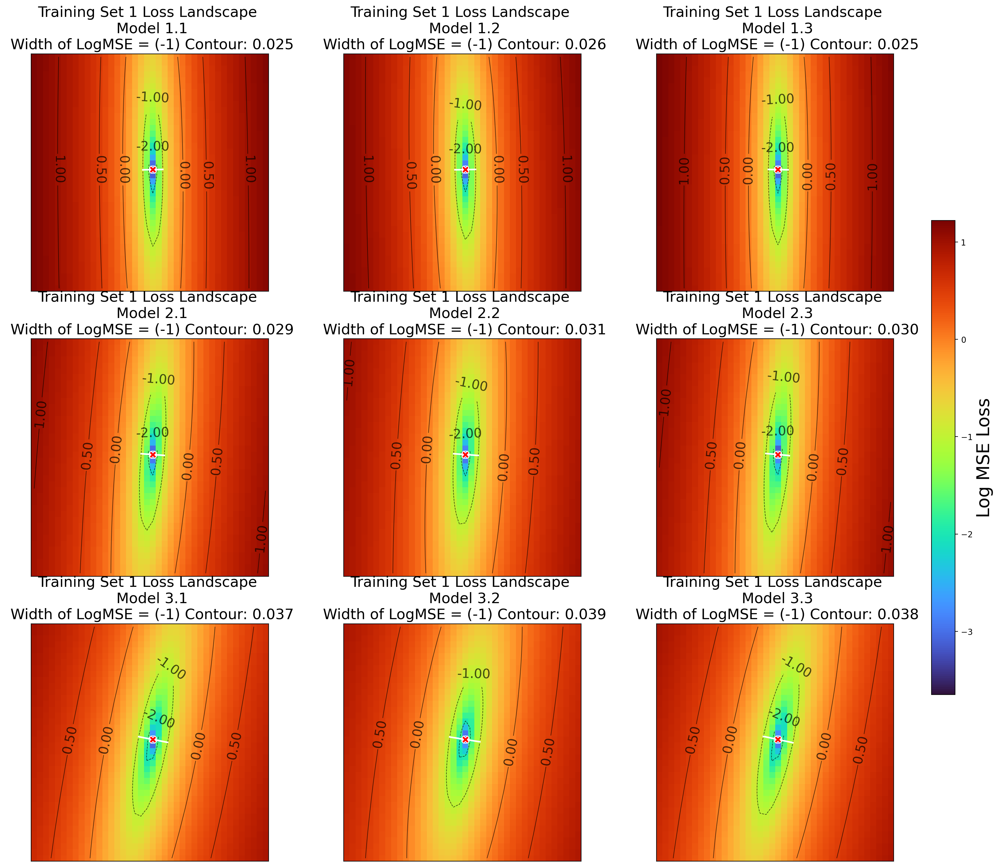


--- Matrix View (Widths) ---
Model_Version         1         2         3
Iteration                                  
1              0.025203  0.026122  0.024926
2              0.029369  0.031208  0.029724
3              0.037190  0.038555  0.038033


In [19]:
# Get all nine landscapes
avg1_1 = get_avg_landscape(iter1_train_jids, 1, alignn_version=1)
avg1_2 = get_avg_landscape(iter1_train_jids, 1, alignn_version=2)
avg1_3 = get_avg_landscape(iter1_train_jids, 1, alignn_version=3)
avg2_1 = get_avg_landscape(iter1_train_jids, 2, alignn_version=1)
avg2_2 = get_avg_landscape(iter1_train_jids, 2, alignn_version=2)
avg2_3 = get_avg_landscape(iter1_train_jids, 2, alignn_version=3)
avg3_1 = get_avg_landscape(iter1_train_jids, 3, alignn_version=1)
avg3_2 = get_avg_landscape(iter1_train_jids, 3, alignn_version=2)
avg3_3 = get_avg_landscape(iter1_train_jids, 3, alignn_version=3)

# Find global vmin/vmax for consistent color scale
vmin = min(np.nanmin(avg1_1), np.nanmin(avg1_2), np.nanmin(avg1_3), np.nanmin(avg2_1), np.nanmin(avg2_2), np.nanmin(avg2_3), np.nanmin(avg3_1), np.nanmin(avg3_2), np.nanmin(avg3_3))
vmax = max(np.nanmax(avg1_1), np.nanmax(avg1_2), np.nanmax(avg1_3), np.nanmax(avg2_1), np.nanmax(avg2_2), np.nanmax(avg2_3), np.nanmax(avg3_1), np.nanmax(avg3_2), np.nanmax(avg3_3))

titles = [
    'Training Set 1 Loss Landscape \n Model 1.1',
    'Training Set 1 Loss Landscape \n Model 1.2',
    'Training Set 1 Loss Landscape \n Model 1.3',
    'Training Set 1 Loss Landscape \n Model 2.1',
    'Training Set 1 Loss Landscape \n Model 2.2',
    'Training Set 1 Loss Landscape \n Model 2.3',
    'Training Set 1 Loss Landscape \n Model 3.1',
    'Training Set 1 Loss Landscape \n Model 3.2',
    'Training Set 1 Loss Landscape \n Model 3.3'
]
landscapes = [avg1_1, avg1_2, avg1_3, avg2_1, avg2_2, avg2_3, avg3_1, avg3_2, avg3_3]

training_set1_records = []

fig, axes = plt.subplots(3, 3, figsize=(21, 18), dpi=200)


for i, (avg_landscape, title) in enumerate(zip(landscapes, titles)):
    ax = axes[i // 3, i % 3]
    
    # Calculate Iteration and Model Version based on grid position (0-8)
    # Rows (0,1,2) -> Iteration (1,2,3)
    # Cols (0,1,2) -> Model (1,2,3)
    iter_num = (i // 3) + 1
    model_ver = (i % 3) + 1
    
    if avg_landscape.ndim == 3: avg_landscape = np.squeeze(avg_landscape)
    x = np.arange(avg_landscape.shape[1])
    y = np.arange(avg_landscape.shape[0])
    X, Y = np.meshgrid(x, y)
    
    # Plot Surface
    im = ax.imshow(avg_landscape, cmap='turbo', vmin=vmin, vmax=vmax, origin='lower')
    contour_lines = ax.contour(X, Y, avg_landscape, levels=levels, colors='black', alpha=0.7, linewidths=0.7)
    ax.clabel(contour_lines, inline=True, fontsize=16, fmt='%.2f')

    # Find minimum point
    min_idx = np.unravel_index(np.nanargmin(avg_landscape), avg_landscape.shape)
    min_point = np.array([X[min_idx], Y[min_idx]])
    ax.scatter(*min_point, color='blue', marker='o', s=80, edgecolors='white', zorder=10)

    
    # Measure Width
    width, dist = get_min_width_via_sweep_all_segments(ax, X, Y, avg_landscape, level=target_level)
    
    # 2. Record the data
    scaled_width = width/step*scale_factor if width else None
    scaled_dist = dist/step*scale_factor
    
    record = {
        'Iteration': iter_num,
        'Model_Version': model_ver,
        'Target_Level': target_level,
        'Training_set1_Width': scaled_width,
        'Training_set1_dist_center_min':scaled_dist
    }
    training_set1_records.append(record)
    
    # Update Title
    if width:
        new_title = f"{title}\n Width of LogMSE = ({int(target_level)}) Contour: {scaled_width:.3f}"
    else:
        new_title = f"{title}\n(Undefined)"
        
    ax.set_title(new_title, fontsize=18)
    ax.set_xticks([])
    ax.set_yticks([])

cbar = fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.025, pad=0.04)
cbar.set_label('Log MSE Loss', fontsize=22)

plt.show()

# --- DISPLAY RECORDS ---
# Convert to DataFrame for nice viewing
df_widths = pd.DataFrame(training_set1_records)



# Optional: Pivot to see it as a matrix (Rows=Iteration, Cols=Model)
pivot_table = df_widths.pivot(index='Iteration', columns='Model_Version', values='Training_set1_Width')
print("\n--- Matrix View (Widths) ---")
print(pivot_table)

#### 5.2 Training Set Loss Landscapes - Progressive Evaluation

Examining loss landscapes where each model is evaluated on its corresponding training iteration data. 


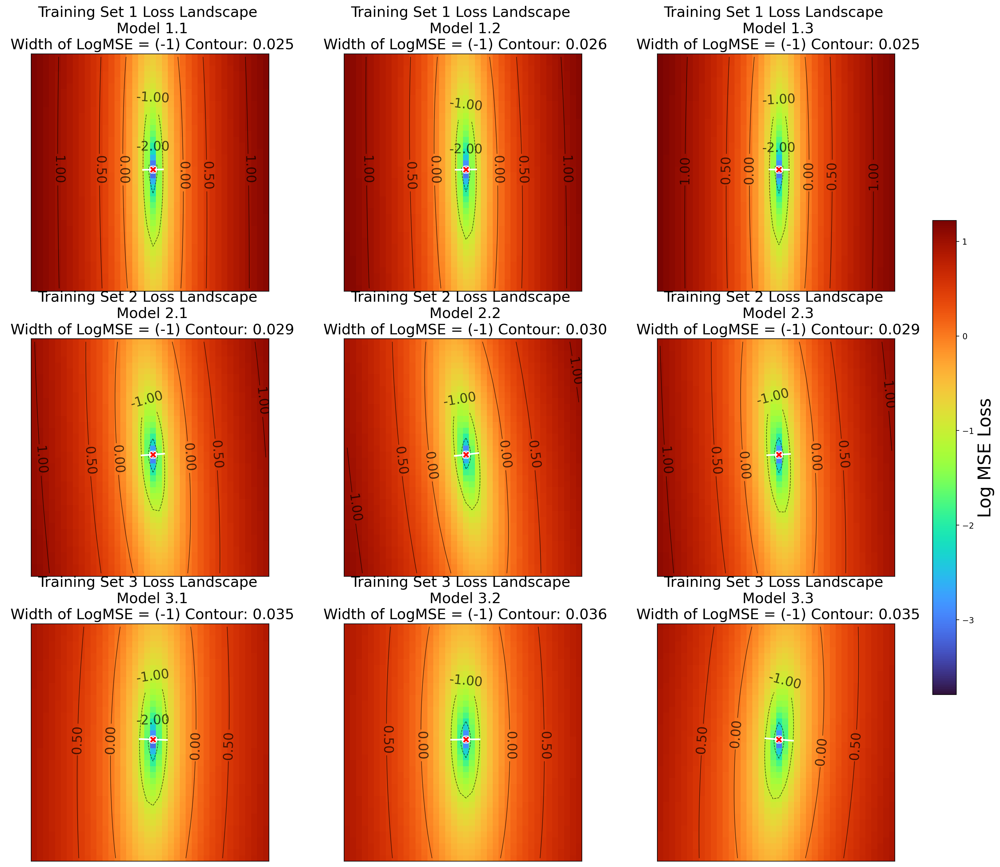


--- Matrix View (Widths) ---
Model_Version         1         2         3
Iteration                                  
1              0.025203  0.026122  0.024926
2              0.028816  0.030075  0.028934
3              0.034529  0.036068  0.035044


In [20]:
# Get all nine landscapes
avg1_1 = get_avg_landscape(iter1_train_jids, 1, alignn_version=1)
avg1_2 = get_avg_landscape(iter1_train_jids, 1, alignn_version=2)
avg1_3 = get_avg_landscape(iter1_train_jids, 1, alignn_version=3)
avg2_1 = get_avg_landscape(iter2_train_jids, 2, alignn_version=1)
avg2_2 = get_avg_landscape(iter2_train_jids, 2, alignn_version=2)
avg2_3 = get_avg_landscape(iter2_train_jids, 2, alignn_version=3)
avg3_1 = get_avg_landscape(iter3_train_jids, 3, alignn_version=1)
avg3_2 = get_avg_landscape(iter3_train_jids, 3, alignn_version=2)
avg3_3 = get_avg_landscape(iter3_train_jids, 3, alignn_version=3)

# Find global vmin/vmax for consistent color scale
vmin = min(np.nanmin(avg1_1), np.nanmin(avg1_2), np.nanmin(avg1_3), np.nanmin(avg2_1), np.nanmin(avg2_2), np.nanmin(avg2_3), np.nanmin(avg3_1), np.nanmin(avg3_2), np.nanmin(avg3_3))
vmax = max(np.nanmax(avg1_1), np.nanmax(avg1_2), np.nanmax(avg1_3), np.nanmax(avg2_1), np.nanmax(avg2_2), np.nanmax(avg2_3), np.nanmax(avg3_1), np.nanmax(avg3_2), np.nanmax(avg3_3))


titles = [
    'Training Set 1 Loss Landscape \n Model 1.1',
    'Training Set 1 Loss Landscape \n Model 1.2',
    'Training Set 1 Loss Landscape \n Model 1.3',
    'Training Set 2 Loss Landscape \n Model 2.1',
    'Training Set 2 Loss Landscape \n Model 2.2',
    'Training Set 2 Loss Landscape \n Model 2.3',
    'Training Set 3 Loss Landscape \n Model 3.1',
    'Training Set 3 Loss Landscape \n Model 3.2',
    'Training Set 3 Loss Landscape \n Model 3.3'
]
landscapes = [avg1_1, avg1_2, avg1_3, avg2_1, avg2_2, avg2_3, avg3_1, avg3_2, avg3_3]


training_sets_records = []

fig, axes = plt.subplots(3, 3, figsize=(21, 18), dpi=200)


for i, (avg_landscape, title) in enumerate(zip(landscapes, titles)):
    ax = axes[i // 3, i % 3]
    
    # Calculate Iteration and Model Version based on grid position (0-8)
    # Rows (0,1,2) -> Iteration (1,2,3)
    # Cols (0,1,2) -> Model (1,2,3)
    iter_num = (i // 3) + 1
    model_ver = (i % 3) + 1
    
    if avg_landscape.ndim == 3: avg_landscape = np.squeeze(avg_landscape)
    x = np.arange(avg_landscape.shape[1])
    y = np.arange(avg_landscape.shape[0])
    X, Y = np.meshgrid(x, y)
    
    # Plot Surface
    im = ax.imshow(avg_landscape, cmap='turbo', vmin=vmin, vmax=vmax, origin='lower')
    contour_lines = ax.contour(X, Y, avg_landscape, levels=levels, colors='black', alpha=0.7, linewidths=0.7)
    ax.clabel(contour_lines, inline=True, fontsize=16, fmt='%.2f')

    # Find minimum point
    min_idx = np.unravel_index(np.nanargmin(avg_landscape), avg_landscape.shape)
    min_point = np.array([X[min_idx], Y[min_idx]])
    ax.scatter(*min_point, color='blue', marker='o', s=80, edgecolors='white', zorder=10)

    
    # Measure Width
    width, dist = get_min_width_via_sweep_all_segments(ax, X, Y, avg_landscape, level=target_level)
    
    # 2. Record the data
    scaled_width = width/step*scale_factor if width else None
    scaled_dist = dist/step*scale_factor
    
    record = {
        'Iteration': iter_num,
        'Model_Version': model_ver,
        'Target_Level': target_level,
        'Training_sets_Width': scaled_width,
        'Training_sets_dist_center_min':scaled_dist
    }
    training_sets_records.append(record)
    
    # Update Title
    if width:
        new_title = f"{title}\n Width of LogMSE = ({int(target_level)}) Contour: {scaled_width:.3f}"
    else:
        new_title = f"{title}\n(Undefined)"
        
    ax.set_title(new_title, fontsize=18)
    ax.set_xticks([])
    ax.set_yticks([])

cbar = fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.025, pad=0.04)
cbar.set_label('Log MSE Loss', fontsize=22)

plt.show()

# --- DISPLAY RECORDS ---
# Convert to DataFrame for nice viewing
df_widths = pd.DataFrame(training_sets_records)



# Optional: Pivot to see it as a matrix (Rows=Iteration, Cols=Model)
pivot_table = df_widths.pivot(index='Iteration', columns='Model_Version', values='Training_sets_Width')
print("\n--- Matrix View (Widths) ---")
print(pivot_table)



#### 5.3 High Uncertainty Test Set Loss Landscapes

Analyzing loss landscapes on high uncertainty holdout samples to understand model behavior in challenging prediction regions. HU set varies across iterations.


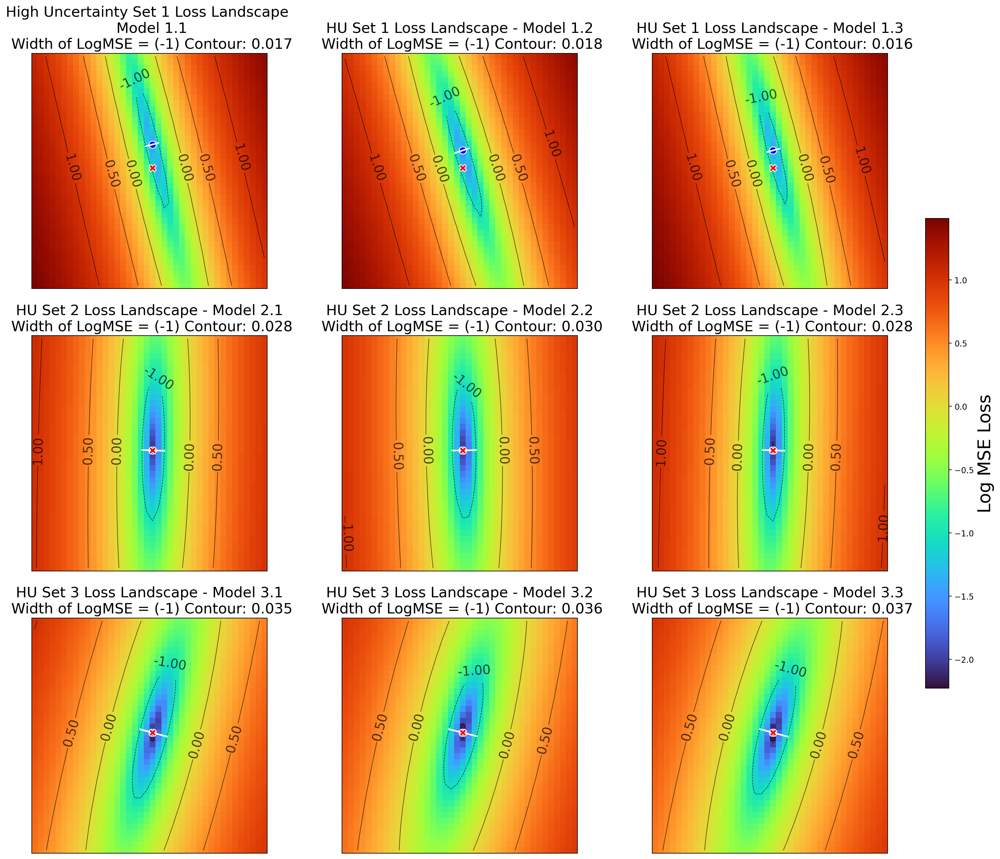

--- HU Loss Landscape Widths ---
   Iteration  Model_Version  Target_Level  HU_Width  HU_dist_center_min
0          1              1            -1  0.016519              0.0300
1          1              2            -1  0.018359              0.0225
2          1              3            -1  0.016108              0.0225
3          2              1            -1  0.028344              0.0000
4          2              2            -1  0.030006              0.0000
5          2              3            -1  0.027771              0.0000
6          3              1            -1  0.035192              0.0000
7          3              2            -1  0.036326              0.0000
8          3              3            -1  0.036907              0.0000

--- Matrix View (Widths) ---
Model_Version         1         2         3
Iteration                                  
1              0.016519  0.018359  0.016108
2              0.028344  0.030006  0.027771
3              0.035192  0.036326  0.0369

In [21]:
# Get all nine landscapes (HU specific based on your input)
avg1_1 = get_avg_landscape(HU_iter_1_jids, 1, alignn_version=1)
avg1_2 = get_avg_landscape(HU_iter_1_jids, 1, alignn_version=2)
avg1_3 = get_avg_landscape(HU_iter_1_jids, 1, alignn_version=3)
avg2_1 = get_avg_landscape(HU_iter_2_jids, 2, alignn_version=1)
avg2_2 = get_avg_landscape(HU_iter_2_jids, 2, alignn_version=2)
avg2_3 = get_avg_landscape(HU_iter_2_jids, 2, alignn_version=3)
avg3_1 = get_avg_landscape(HU_iter_3_jids, 3, alignn_version=1)
avg3_2 = get_avg_landscape(HU_iter_3_jids, 3, alignn_version=2)
avg3_3 = get_avg_landscape(HU_iter_3_jids, 3, alignn_version=3)

# Find global vmin/vmax for consistent color scale
vmin = min(np.nanmin(avg1_1), np.nanmin(avg1_2), np.nanmin(avg1_3), np.nanmin(avg2_1), np.nanmin(avg2_2), np.nanmin(avg2_3), np.nanmin(avg3_1), np.nanmin(avg3_2), np.nanmin(avg3_3))
vmax = max(np.nanmax(avg1_1), np.nanmax(avg1_2), np.nanmax(avg1_3), np.nanmax(avg2_1), np.nanmax(avg2_2), np.nanmax(avg2_3), np.nanmax(avg3_1), np.nanmax(avg3_2), np.nanmax(avg3_3))

titles = [
    'High Uncertainty Set 1 Loss Landscape \n Model 1.1',
    'HU Set 1 Loss Landscape - Model 1.2',
    'HU Set 1 Loss Landscape - Model 1.3',
    'HU Set 2 Loss Landscape - Model 2.1',
    'HU Set 2 Loss Landscape - Model 2.2',
    'HU Set 2 Loss Landscape - Model 2.3',
    'HU Set 3 Loss Landscape - Model 3.1',
    'HU Set 3 Loss Landscape - Model 3.2',
    'HU Set 3 Loss Landscape - Model 3.3'
]
landscapes = [avg1_1, avg1_2, avg1_3, avg2_1, avg2_2, avg2_3, avg3_1, avg3_2, avg3_3]

# --- MODIFIED PLOTTING & RECORDING LOOP ---

# 1. Initialize a list to store the records
hu_width_records = []

fig, axes = plt.subplots(3, 3, figsize=(21, 18), dpi=200)


for i, (avg_landscape, title) in enumerate(zip(landscapes, titles)):
    ax = axes[i // 3, i % 3]
    
    # Calculate Iteration and Model Version based on grid position (0-8)
    # Rows (0,1,2) -> Iteration (1,2,3)
    # Cols (0,1,2) -> Model (1,2,3)
    iter_num = (i // 3) + 1
    model_ver = (i % 3) + 1
    
    if avg_landscape.ndim == 3: avg_landscape = np.squeeze(avg_landscape)
    x = np.arange(avg_landscape.shape[1])
    y = np.arange(avg_landscape.shape[0])
    X, Y = np.meshgrid(x, y)
    
    # Plot Surface
    im = ax.imshow(avg_landscape, cmap='turbo', vmin=vmin, vmax=vmax, origin='lower')
    contour_lines = ax.contour(X, Y, avg_landscape, levels=levels, colors='black', alpha=0.7, linewidths=0.7)
    ax.clabel(contour_lines, inline=True, fontsize=16, fmt='%.2f')

    # Find minimum point
    min_idx = np.unravel_index(np.nanargmin(avg_landscape), avg_landscape.shape)
    min_point = np.array([X[min_idx], Y[min_idx]])
    ax.scatter(*min_point, color='blue', marker='o', s=80, edgecolors='white', zorder=10)

    
    # Measure Width
    width, dist = get_min_width_via_sweep_all_segments(ax, X, Y, avg_landscape, level=target_level)
    
    # 2. Record the data
    scaled_width = width/step*scale_factor if width else None
    scaled_dist = dist/step*scale_factor
    
    record = {
        'Iteration': iter_num,
        'Model_Version': model_ver,
        'Target_Level': target_level,
        'HU_Width': scaled_width,
        'HU_dist_center_min':scaled_dist
    }
    hu_width_records.append(record)
    
    # Update Title
    if width:
        new_title = f"{title}\n Width of LogMSE = ({int(target_level)}) Contour: {scaled_width:.3f}"
    else:
        new_title = f"{title}\n(Undefined)"
        
    ax.set_title(new_title, fontsize=18)
    ax.set_xticks([])
    ax.set_yticks([])

cbar = fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.025, pad=0.04)
cbar.set_label('Log MSE Loss', fontsize=22)

plt.show()

# --- DISPLAY RECORDS ---
# Convert to DataFrame for nice viewing
df_widths = pd.DataFrame(hu_width_records)

print("--- HU Loss Landscape Widths ---")
print(df_widths)

# Optional: Pivot to see it as a matrix (Rows=Iteration, Cols=Model)
pivot_table = df_widths.pivot(index='Iteration', columns='Model_Version', values='HU_Width')
print("\n--- Matrix View (Widths) ---")
print(pivot_table)

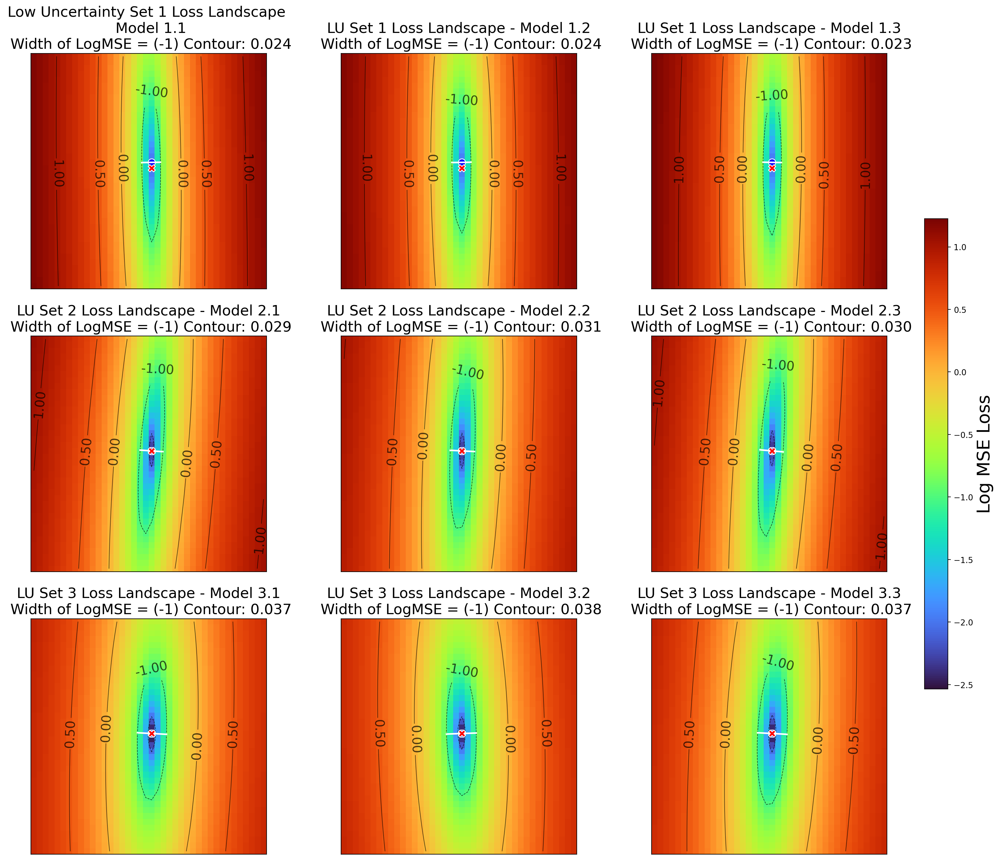

--- LU Loss Landscape Widths ---
   Iteration  Model_Version  Target_Level  LU_Width  LU_dist_center_min
0          1              1            -1  0.023868              0.0075
1          1              2            -1  0.024323              0.0075
2          1              3            -1  0.023419              0.0075
3          2              1            -1  0.029038              0.0000
4          2              2            -1  0.030951              0.0000
5          2              3            -1  0.029510              0.0000
6          3              1            -1  0.037033              0.0000
7          3              2            -1  0.037846              0.0000
8          3              3            -1  0.037435              0.0000

--- Matrix View (LU Widths) ---
Model_Version         1         2         3
Iteration                                  
1              0.023868  0.024323  0.023419
2              0.029038  0.030951  0.029510
3              0.037033  0.037846  0.0

In [22]:

# --- 1. Initialize Data Recording ---
lu_width_records = []

# --- 2. Prepare Data (LU Sets) ---
# Get all nine landscapes
avg1_1 = get_avg_landscape(LU_iter_1_jids, 1, alignn_version=1)
avg1_2 = get_avg_landscape(LU_iter_1_jids, 1, alignn_version=2)
avg1_3 = get_avg_landscape(LU_iter_1_jids, 1, alignn_version=3)
avg2_1 = get_avg_landscape(LU_iter_2_jids, 2, alignn_version=1)
avg2_2 = get_avg_landscape(LU_iter_2_jids, 2, alignn_version=2)
avg2_3 = get_avg_landscape(LU_iter_2_jids, 2, alignn_version=3)
avg3_1 = get_avg_landscape(LU_iter_3_jids, 3, alignn_version=1)
avg3_2 = get_avg_landscape(LU_iter_3_jids, 3, alignn_version=2)
avg3_3 = get_avg_landscape(LU_iter_3_jids, 3, alignn_version=3)

landscapes = [avg1_1, avg1_2, avg1_3, avg2_1, avg2_2, avg2_3, avg3_1, avg3_2, avg3_3]

titles = [
    'Low Uncertainty Set 1 Loss Landscape \n Model 1.1',
    'LU Set 1 Loss Landscape - Model 1.2',
    'LU Set 1 Loss Landscape - Model 1.3',
    'LU Set 2 Loss Landscape - Model 2.1',
    'LU Set 2 Loss Landscape - Model 2.2',
    'LU Set 2 Loss Landscape - Model 2.3',
    'LU Set 3 Loss Landscape - Model 3.1',
    'LU Set 3 Loss Landscape - Model 3.2',
    'LU Set 3 Loss Landscape - Model 3.3'
]

# Find global vmin/vmax for consistent color scale
all_mins = [np.nanmin(x) for x in landscapes]
all_maxs = [np.nanmax(x) for x in landscapes]
vmin = min(all_mins)
vmax = max(all_maxs)

# --- 3. Plotting & Measuring Loop ---
fig, axes = plt.subplots(3, 3, figsize=(21, 18), dpi=200)


for i, (avg_landscape, title) in enumerate(zip(landscapes, titles)):
    ax = axes[i // 3, i % 3]
    
    # Identify Iteration and Model Version
    iter_num = (i // 3) + 1
    model_ver = (i % 3) + 1
    
    if avg_landscape.ndim == 3: avg_landscape = np.squeeze(avg_landscape)
    x = np.arange(avg_landscape.shape[1])
    y = np.arange(avg_landscape.shape[0])
    X, Y = np.meshgrid(x, y)
    
    # Plot Surface
    im = ax.imshow(avg_landscape, cmap='turbo', vmin=vmin, vmax=vmax, origin='lower')
    contour_lines = ax.contour(X, Y, avg_landscape, levels=levels, colors='black', alpha=0.7, linewidths=0.7)
    ax.clabel(contour_lines, inline=True, fontsize=16, fmt='%.2f')

        # Find minimum point
    min_idx = np.unravel_index(np.nanargmin(avg_landscape), avg_landscape.shape)
    min_point = np.array([X[min_idx], Y[min_idx]])
    ax.scatter(*min_point, color='blue', marker='o', s=80, edgecolors='white', zorder=10)
    
    # Measure Width
    width, dist = get_min_width_via_sweep_all_segments(ax, X, Y, avg_landscape, level=target_level)
    
    # 2. Record the data
    scaled_width = width/step*scale_factor if width else None
    scaled_dist = dist/step*scale_factor
    
    record = {
        'Iteration': iter_num,
        'Model_Version': model_ver,
        'Target_Level': target_level,
        'LU_Width': scaled_width,
        'LU_dist_center_min':scaled_dist
    }
    lu_width_records.append(record)
    
    # Update Title
    if width:
        new_title = f"{title}\n Width of LogMSE = ({int(target_level)}) Contour: {scaled_width:.3f}"
    else:
        new_title = f"{title}\n(Undefined)"
        
    ax.set_title(new_title, fontsize=18)
    ax.set_xticks([])
    ax.set_yticks([])

cbar = fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.025, pad=0.04)
cbar.set_label('Log MSE Loss', fontsize=22)

plt.show()

# --- 4. Display Data Table ---
df_lu_widths = pd.DataFrame(lu_width_records)

print("--- LU Loss Landscape Widths ---")
print(df_lu_widths)

# Optional: Pivot view
print("\n--- Matrix View (LU Widths) ---")
pivot_lu = df_lu_widths.pivot(index='Iteration', columns='Model_Version', values='LU_Width')
print(pivot_lu)

#### 5.5 Fixed Test Set Loss Landscapes

Visualizing loss landscapes on the initially chosen fixed test set to maintain consistency across all model evaluations. This subset provides a controlled comparison point for understanding how different training iterations affect model behavior on a standardized test set.



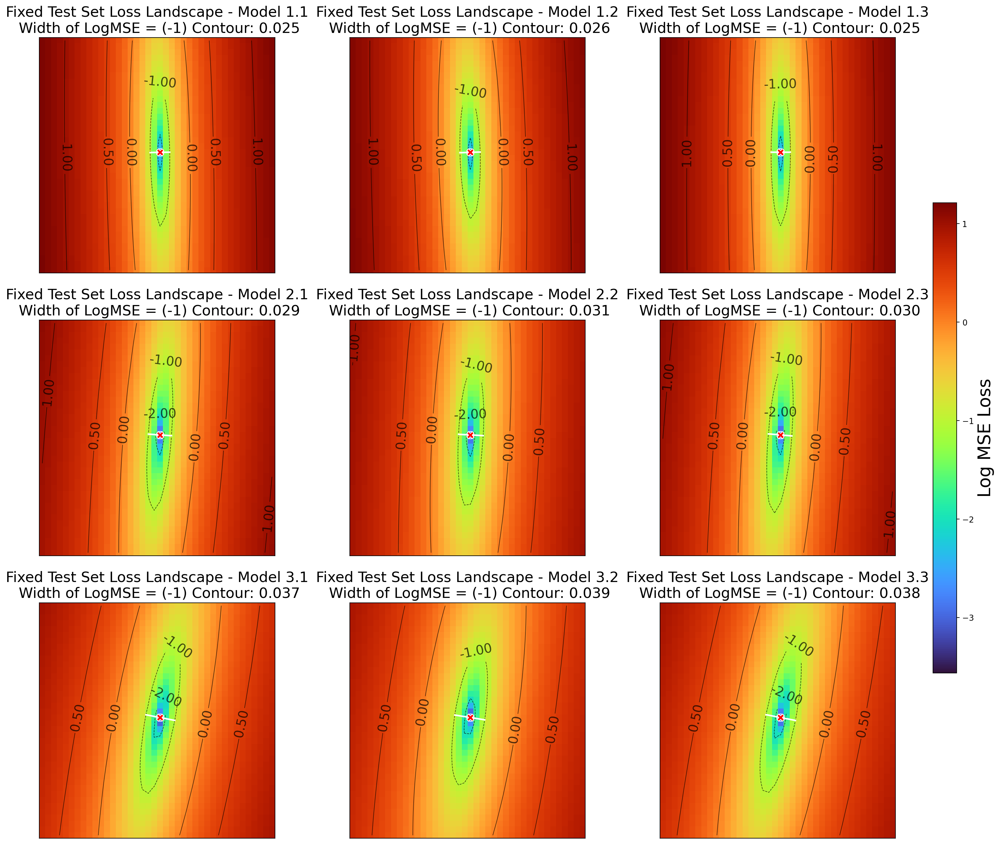

--- Fixed Test Set Loss Landscape Widths ---
   Iteration  Model_Version  Target_Level  fixed_Width  fixed_dist_center_min
0          1              1            -1     0.024888                    0.0
1          1              2            -1     0.025750                    0.0
2          1              3            -1     0.024557                    0.0
3          2              1            -1     0.029400                    0.0
4          2              2            -1     0.031313                    0.0
5          2              3            -1     0.029902                    0.0
6          3              1            -1     0.037346                    0.0
7          3              2            -1     0.038548                    0.0
8          3              3            -1     0.038125                    0.0

--- Matrix View (Fixed Set Widths) ---
Model_Version         1         2         3
Iteration                                  
1              0.024888  0.025750  0.024557
2  

In [23]:
# --- 1. Initialize Data Recording ---
fixed_width_records = []

# --- 2. Prepare Data (Fixed Test Set) ---
# Note: We use 'its_iter_1_jids' for all because it is the "Fixed" set
avg1_1 = get_avg_landscape(its_iter_1_jids, 1, alignn_version=1)
avg1_2 = get_avg_landscape(its_iter_1_jids, 1, alignn_version=2)
avg1_3 = get_avg_landscape(its_iter_1_jids, 1, alignn_version=3)
avg2_1 = get_avg_landscape(its_iter_1_jids, 2, alignn_version=1)
avg2_2 = get_avg_landscape(its_iter_1_jids, 2, alignn_version=2)
avg2_3 = get_avg_landscape(its_iter_1_jids, 2, alignn_version=3)
avg3_1 = get_avg_landscape(its_iter_1_jids, 3, alignn_version=1)
avg3_2 = get_avg_landscape(its_iter_1_jids, 3, alignn_version=2)
avg3_3 = get_avg_landscape(its_iter_1_jids, 3, alignn_version=3)

landscapes = [avg1_1, avg1_2, avg1_3, avg2_1, avg2_2, avg2_3, avg3_1, avg3_2, avg3_3]

titles = [
    'Fixed Test Set Loss Landscape - Model 1.1',
    'Fixed Test Set Loss Landscape - Model 1.2',
    'Fixed Test Set Loss Landscape - Model 1.3',
    'Fixed Test Set Loss Landscape - Model 2.1',
    'Fixed Test Set Loss Landscape - Model 2.2',
    'Fixed Test Set Loss Landscape - Model 2.3',
    'Fixed Test Set Loss Landscape - Model 3.1',
    'Fixed Test Set Loss Landscape - Model 3.2',
    'Fixed Test Set Loss Landscape - Model 3.3'
]

# Find global vmin/vmax for consistent color scale
all_mins = [np.nanmin(x) for x in landscapes]
all_maxs = [np.nanmax(x) for x in landscapes]
vmin = min(all_mins)
vmax = max(all_maxs)

# --- 3. Plotting & Measuring Loop ---
fig, axes = plt.subplots(3, 3, figsize=(21, 18), dpi=200)


for i, (avg_landscape, title) in enumerate(zip(landscapes, titles)):
    ax = axes[i // 3, i % 3]
    
    # Identify Iteration and Model Version
    iter_num = (i // 3) + 1
    model_ver = (i % 3) + 1
    
    if avg_landscape.ndim == 3: avg_landscape = np.squeeze(avg_landscape)
    x = np.arange(avg_landscape.shape[1])
    y = np.arange(avg_landscape.shape[0])
    X, Y = np.meshgrid(x, y)
    
    # Plot Surface
    im = ax.imshow(avg_landscape, cmap='turbo', vmin=vmin, vmax=vmax, origin='lower')
    contour_lines = ax.contour(X, Y, avg_landscape, levels=levels, colors='black', alpha=0.7, linewidths=0.7)
    ax.clabel(contour_lines, inline=True, fontsize=16, fmt='%.2f')

        # Find minimum point
    min_idx = np.unravel_index(np.nanargmin(avg_landscape), avg_landscape.shape)
    min_point = np.array([X[min_idx], Y[min_idx]])
    ax.scatter(*min_point, color='blue', marker='o', s=80, edgecolors='white', zorder=10)
    
    # Measure Width
    width, dist = get_min_width_via_sweep_all_segments(ax, X, Y, avg_landscape, level=target_level)
    
    # 2. Record the data
    scaled_width = width/step*scale_factor if width else None
    scaled_dist = dist/step*scale_factor
    
    record = {
        'Iteration': iter_num,
        'Model_Version': model_ver,
        'Target_Level': target_level,
        'fixed_Width': scaled_width,
        'fixed_dist_center_min':scaled_dist
    }
    fixed_width_records.append(record)
    
    # Update Title
    if width:
        new_title = f"{title}\n Width of LogMSE = ({int(target_level)}) Contour: {scaled_width:.3f}"
    else:
        new_title = f"{title}\n(Undefined)"
        
    ax.set_title(new_title, fontsize=18)
    ax.set_xticks([])
    ax.set_yticks([])

cbar = fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.025, pad=0.04)
cbar.set_label('Log MSE Loss', fontsize=22)

plt.show()

# --- 4. Display Data Table ---
df_fixed_widths = pd.DataFrame(fixed_width_records)

print("--- Fixed Test Set Loss Landscape Widths ---")
print(df_fixed_widths)

# Optional: Pivot view
print("\n--- Matrix View (Fixed Set Widths) ---")
pivot_fixed = df_fixed_widths.pivot(index='Iteration', columns='Model_Version', values='fixed_Width')
print(pivot_fixed)

### Comparing the change in iso contour loss change and distance between original and optimal model for different datasets

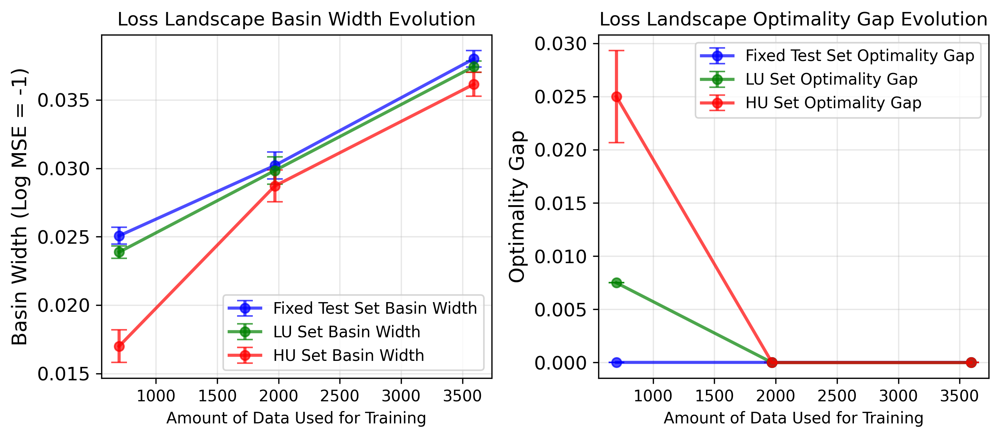

In [24]:
# Boolean flags to control which curves to plot
plot_fixed = True
plot_lu = True
plot_hu = True
plot_training_set1 = False
plot_training_sets = False

# 1. DATA PREPARATION
# Convert the record lists from previous steps into DataFrames
df_fixed = pd.DataFrame(fixed_width_records)
df_lu = pd.DataFrame(lu_width_records)
df_hu = pd.DataFrame(hu_width_records)
df_training_set1 = pd.DataFrame(training_set1_records)
df_training_sets = pd.DataFrame(training_sets_records)

# 2. AGGREGATE STATISTICS (Mean & Std Dev per Iteration)
# We group by 'Iteration' to average the 3 models (Model 1.1, 1.2, 1.3, etc.)
fixed_stats = df_fixed.groupby('Iteration')['fixed_Width'].agg(['mean', 'std', 'count']).sort_index()
lu_stats = df_lu.groupby('Iteration')['LU_Width'].agg(['mean', 'std', 'count']).sort_index()
hu_stats = df_hu.groupby('Iteration')['HU_Width'].agg(['mean', 'std', 'count']).sort_index()
training_set1_stats = df_training_set1.groupby('Iteration')['Training_set1_Width'].agg(['mean', 'std', 'count']).sort_index()
training_sets_stats = df_training_sets.groupby('Iteration')['Training_sets_Width'].agg(['mean', 'std', 'count']).sort_index()

# Distance statistics
fixed_dist_stats = df_fixed.groupby('Iteration')['fixed_dist_center_min'].agg(['mean', 'std', 'count']).sort_index()
lu_dist_stats = df_lu.groupby('Iteration')['LU_dist_center_min'].agg(['mean', 'std', 'count']).sort_index()
hu_dist_stats = df_hu.groupby('Iteration')['HU_dist_center_min'].agg(['mean', 'std', 'count']).sort_index()
training_set1_dist_stats = df_training_set1.groupby('Iteration')['Training_set1_dist_center_min'].agg(['mean', 'std', 'count']).sort_index()
training_sets_dist_stats = df_training_sets.groupby('Iteration')['Training_sets_dist_center_min'].agg(['mean', 'std', 'count']).sort_index()


# 4. PLOTTING
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4), dpi=300)

# Calculate y-limits dynamically for width plot
all_means_list = []
all_stds_list = []
if plot_fixed:
    all_means_list.append(fixed_stats['mean'])
    all_stds_list.append(fixed_stats['std'])
if plot_lu:
    all_means_list.append(lu_stats['mean'])
    all_stds_list.append(lu_stats['std'])
if plot_hu:
    all_means_list.append(hu_stats['mean'])
    all_stds_list.append(hu_stats['std'])
if plot_training_set1:
    all_means_list.append(training_set1_stats['mean'])
    all_stds_list.append(training_set1_stats['std'])
if plot_training_sets:
    all_means_list.append(training_sets_stats['mean'])
    all_stds_list.append(training_sets_stats['std'])

all_means = pd.concat(all_means_list)
all_stds = pd.concat(all_stds_list)
y_min = (all_means - all_stds).min() * 0.9
y_max = (all_means + all_stds).max() * 1.1

# Plot Width (Left subplot)
if plot_fixed:
    ax1.errorbar(
        sample_counts, 
        fixed_stats['mean'], 
        yerr=fixed_stats['std'], 
        label='Fixed Test Set Basin Width', 
        marker='o', linewidth=2, color='blue', alpha=0.7, capsize=5
    )

if plot_lu:
    ax1.errorbar(
        sample_counts, 
        lu_stats['mean'], 
        yerr=lu_stats['std'], 
        label='LU Set Basin Width', 
        marker='o', linewidth=2, color='green', alpha=0.7, capsize=5
    )

if plot_hu:
    ax1.errorbar(
        sample_counts, 
        hu_stats['mean'], 
        yerr=hu_stats['std'], 
        label='HU Set Basin Width', 
        marker='o', linewidth=2, color='red', alpha=0.7, capsize=5
    )

if plot_training_set1:
    ax1.errorbar(
        sample_counts, 
        training_set1_stats['mean'], 
        yerr=training_set1_stats['std'], 
        label='Training Set 1 Basin Width', 
        marker='o', linewidth=2, color='orange', alpha=0.7, capsize=5
    )

if plot_training_sets:
    ax1.errorbar(
        sample_counts, 
        training_sets_stats['mean'], 
        yerr=training_sets_stats['std'], 
        label='Training Sets Basin Width', 
        marker='o', linewidth=2, color='purple', alpha=0.7, capsize=5
    )

# Formatting for width plot
ax1.set_xlabel('Amount of Data Used for Training')
ax1.set_ylabel(f'Basin Width (Log MSE = {target_level})', fontsize=13)
ax1.set_title('Loss Landscape Basin Width Evolution')
ax1.legend()
ax1.grid(True, alpha=0.3)
ax1.tick_params(axis='y', labelsize=12)

# Calculate y-limits dynamically for distance plot
all_dist_means_list = []
all_dist_stds_list = []
if plot_fixed:
    all_dist_means_list.append(fixed_dist_stats['mean'])
    all_dist_stds_list.append(fixed_dist_stats['std'])
if plot_lu:
    all_dist_means_list.append(lu_dist_stats['mean'])
    all_dist_stds_list.append(lu_dist_stats['std'])
if plot_hu:
    all_dist_means_list.append(hu_dist_stats['mean'])
    all_dist_stds_list.append(hu_dist_stats['std'])
if plot_training_set1:
    all_dist_means_list.append(training_set1_dist_stats['mean'])
    all_dist_stds_list.append(training_set1_dist_stats['std'])
if plot_training_sets:
    all_dist_means_list.append(training_sets_dist_stats['mean'])
    all_dist_stds_list.append(training_sets_dist_stats['std'])

all_dist_means = pd.concat(all_dist_means_list)
all_dist_stds = pd.concat(all_dist_stds_list)
y_min_dist = (all_dist_means - all_dist_stds).min() * 0.9
y_max_dist = (all_dist_means + all_dist_stds).max() * 1.1

# Plot Distance (Right subplot)
if plot_fixed:
    ax2.errorbar(
        sample_counts, 
        fixed_dist_stats['mean'], 
        yerr=fixed_dist_stats['std'], 
        label='Fixed Test Set Optimality Gap', 
        marker='o', linewidth=2, color='blue', alpha=0.7, capsize=5
    )

if plot_lu:
    ax2.errorbar(
        sample_counts, 
        lu_dist_stats['mean'], 
        yerr=lu_dist_stats['std'], 
        label='LU Set Optimality Gap', 
        marker='o', linewidth=2, color='green', alpha=0.7, capsize=5
    )

if plot_hu:
    ax2.errorbar(
        sample_counts, 
        hu_dist_stats['mean'], 
        yerr=hu_dist_stats['std'], 
        label='HU Set Optimality Gap', 
        marker='o', linewidth=2, color='red', alpha=0.7, capsize=5
    )

if plot_training_set1:
    ax2.errorbar(
        sample_counts, 
        training_set1_dist_stats['mean'], 
        yerr=training_set1_dist_stats['std'], 
        label='Training Set 1 Optimality Gap', 
        marker='o', linewidth=2, color='orange', alpha=0.7, capsize=5
    )

if plot_training_sets:
    ax2.errorbar(
        sample_counts, 
        training_sets_dist_stats['mean'], 
        yerr=training_sets_dist_stats['std'], 
        label='Training Sets Optimality Gap', 
        marker='o', linewidth=2, color='purple', alpha=0.7, capsize=5
    )

# Formatting for distance plot
ax2.set_xlabel('Amount of Data Used for Training')
ax2.set_ylabel('Optimality Gap', fontsize=13)
ax2.set_title('Loss Landscape Optimality Gap Evolution')
ax2.legend()
ax2.grid(True, alpha=0.3)
ax2.tick_params(axis='y', labelsize=12)

plt.tight_layout()
plt.show()

paper summary figure

In [25]:
# Get all nine landscapes
avg1_1 = get_avg_landscape(its_iter_1_jids, 1, alignn_version=1)
avg1_2 = get_avg_landscape(HU_iter_1_jids, 1, alignn_version=1)
avg1_3 = get_avg_landscape(LU_iter_1_jids, 1, alignn_version=1)
avg2_1 = get_avg_landscape(its_iter_1_jids, 2, alignn_version=1)
avg2_2 = get_avg_landscape(HU_iter_2_jids, 2, alignn_version=1)
avg2_3 = get_avg_landscape(LU_iter_2_jids, 2, alignn_version=1)
avg3_1 = get_avg_landscape(its_iter_1_jids, 3, alignn_version=1)
avg3_2 = get_avg_landscape(HU_iter_3_jids, 3, alignn_version=1)
avg3_3 = get_avg_landscape(LU_iter_3_jids, 3, alignn_version=1)

# Find global vmin/vmax for consistent color scale
vmin = min(np.nanmin(avg1_1), np.nanmin(avg1_2), np.nanmin(avg1_3), np.nanmin(avg2_1), np.nanmin(avg2_2), np.nanmin(avg2_3), np.nanmin(avg3_1), np.nanmin(avg3_2), np.nanmin(avg3_3))
vmax = max(np.nanmax(avg1_1), np.nanmax(avg1_2), np.nanmax(avg1_3), np.nanmax(avg2_1), np.nanmax(avg2_2), np.nanmax(avg2_3), np.nanmax(avg3_1), np.nanmax(avg3_2), np.nanmax(avg3_3))

fig, axes = plt.subplots(3, 3, figsize=(21, 18), dpi=600)

titles = [
    'Fixed Test Set Loss - Model 1.1',
    'HU 1 Set Loss - Model 1.1',
    'LU 1 Set Loss - Model 1.1',
    'Fixed Test Set Loss - Model 2.1',
    'HU 2 Set Loss - Model 2.1',
    'LU 2 Set Loss - Model 2.1',
    'Fixed Test Set Loss - Model 3.1',
    'HU 3 Set Loss - Model 3.1',
    'LU 3 Set Loss - Model 3.1'
]
landscapes = [avg1_1, avg1_2, avg1_3, avg2_1, avg2_2, avg2_3, avg3_1, avg3_2, avg3_3]


for i, (avg_landscape, title) in enumerate(zip(landscapes, titles)):
    ax = axes[i // 3, i % 3]
    
    if avg_landscape.ndim == 3: avg_landscape = np.squeeze(avg_landscape)
    x = np.arange(avg_landscape.shape[1])
    y = np.arange(avg_landscape.shape[0])
    X, Y = np.meshgrid(x, y)
    
    # Plot Surface
    im = ax.imshow(avg_landscape, cmap='turbo', vmin=vmin, vmax=vmax, origin='lower')
    contour_lines = ax.contour(X, Y, avg_landscape, levels=levels, colors='black', alpha=0.7, linewidths=0.7)
    ax.clabel(contour_lines, inline=True, fontsize=16, fmt='%.2f')

        # Find minimum point
    min_idx = np.unravel_index(np.nanargmin(avg_landscape), avg_landscape.shape)
    min_point = np.array([X[min_idx], Y[min_idx]])
    ax.scatter(*min_point, color='blue', marker='o', s=80, edgecolors='white', zorder=10)

    width, dist = get_min_width_via_sweep_all_segments(ax, X, Y, avg_landscape, level=target_level)
    
    if width:
        new_title = f"{title}\n Width of LogMSE = ({int(target_level)}) Contour: {width/step*scale_factor:.3f}"
    else:
        new_title = f"{title}\n(Undefined)"
        
    ax.set_title(new_title, fontsize=18)
    ax.set_xticks([])
    ax.set_yticks([])

# Yes, they are sharing the same color bar - this creates one colorbar for all subplots
cbar = fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.025, pad=0.04)
cbar.set_label('Log MSE Loss', fontsize=22)

plt.show()




In [26]:
df_fixed = pd.DataFrame(fixed_width_records)
df_lu = pd.DataFrame(lu_width_records)
df_hu = pd.DataFrame(hu_width_records)

# Merge all width dataframes with non-overlapping columns
df_outcome = df_fixed.copy()
df_outcome['HU_Width'] = df_hu['HU_Width']
df_outcome['LU_Width'] = df_lu['LU_Width']